In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

from config import Config
import utils
import model_101 as modellib
import visualize
from model import log
from dsb2018 import Dsb2018Dataset
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')



%matplotlib inline

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Root directory of the project
ROOT_DIR = os.getcwd()

/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "dsb2018_logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Size of train data:603
Size of val data:67


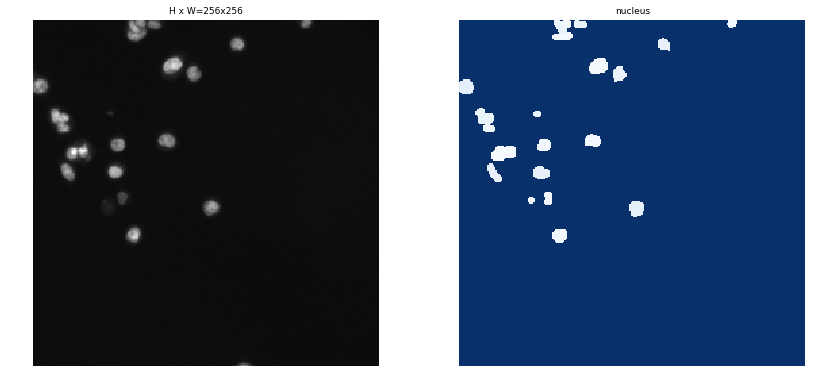

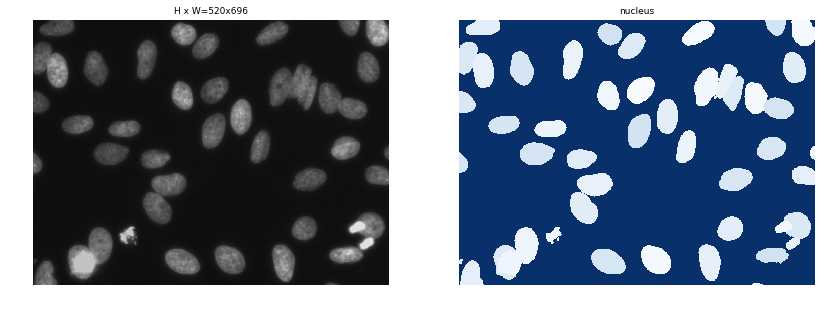

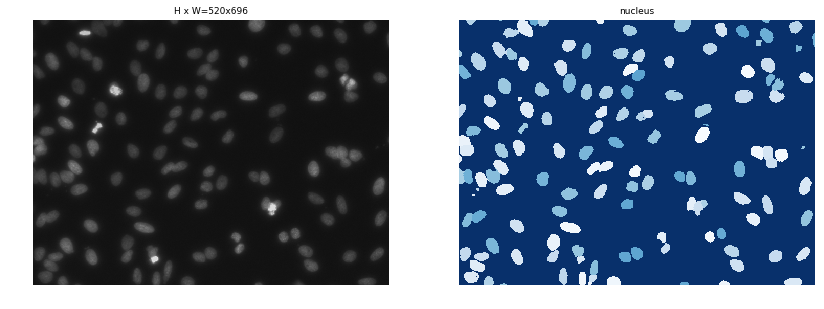

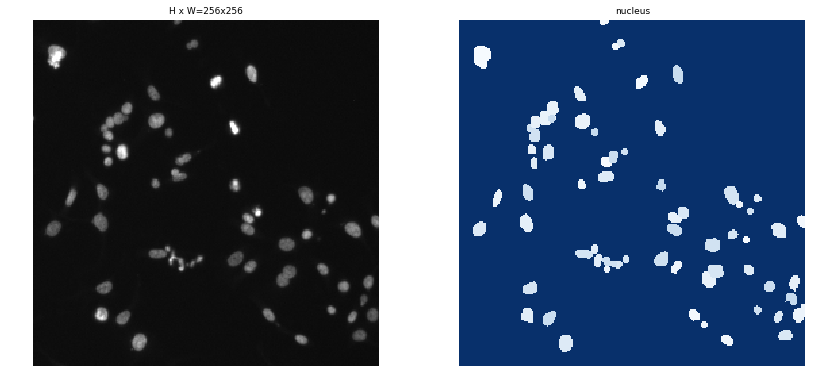

In [3]:
# Training dataset
train_data = Dsb2018Dataset()
train_data.load_dsb2018('../DSB2018')
train_data.prepare()

val_data = Dsb2018Dataset()
val_data.load_dsb2018('../DSB2018', is_trainset=False)
val_data.prepare()
print("Size of train data:{}".format(len(train_data.image_ids)))
print("Size of val data:{}".format(len(val_data.image_ids)))


#Load and display random samples
image_ids = np.random.choice(train_data.image_ids, 2)
for image_id in image_ids:
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    
    
#Load and display random samples
image_ids = np.random.choice(val_data.image_ids, 2)
for image_id in image_ids:
    image = val_data.load_image(image_id)
    mask, class_ids = val_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, val_data.class_names, limit=1)


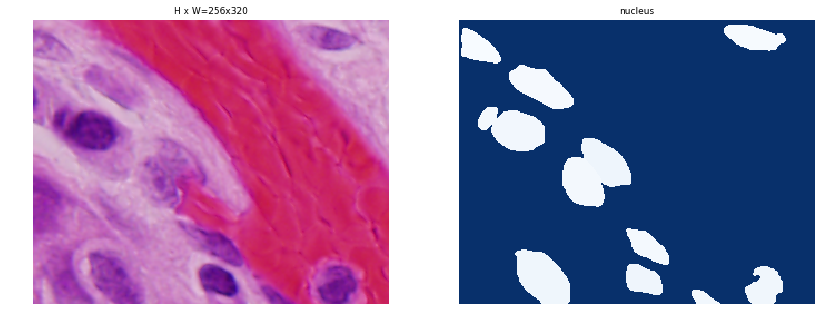

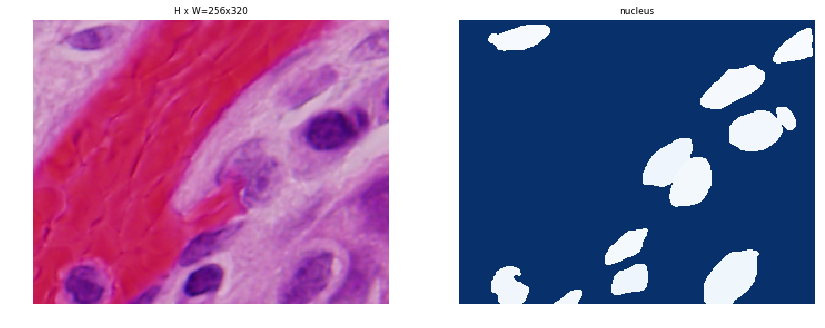

In [4]:
from skimage.io import imread, imshow, imread_collection, concatenate_images


image_ids = np.random.choice(train_data.image_ids, 1)
for image_id in image_ids:
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    output_image, output_masks = modellib.data_augmentation(image, mask )
    visualize.display_top_masks(output_image, output_masks, class_ids, train_data.class_names, limit=1)



In [ ]:
class Dsb2018Config(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "DSB2018"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 3 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    
    USE_MINI_MASK = True
    
    #MINI_MASK_SHAPE = (112, 112)  # (height, width) of the mini-mask


    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64,128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    
    #TODO: in trainning time, set both of these two as 100 and change to 200 during predication time!
    TRAIN_ROIS_PER_IMAGE = 400
    
    #RPN_TRAIN_ANCHORS_PER_IMAGE = 512

    #RPN_NMS_THRESHOLD = 0.7
    
    DETECTION_MAX_INSTANCES = 250
    
    MAX_GT_INSTANCES = 300

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 304

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 36
    
    DETECTION_MIN_CONFIDENCE = 0.7

config = Dsb2018Config()

# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last()[1], by_name=True)

print("model ready!")

using architecture:resnet101


In [ ]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.

LEARNING_RATE=1e-5

# model.train(train_data, val_data,
#             learning_rate=config.LEARNING_RATE,
#             epochs=800,
#             layers='all')

model.train(train_data, val_data,
             learning_rate=config.LEARNING_RATE,
             epochs=800,
             layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/dsb201820180308T0919/mask_rcnn_dsb2018_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4  

In [11]:
import scipy.misc
        
import json
from skimage.io import imread, imshow, imread_collection, concatenate_images
import matplotlib.pyplot as plt
from utils import resize_image, resize_mask

class InferenceConfig(Dsb2018Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
# model_path = model.find_last()[1]
model_path = '/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/dsb201820180307T1100/mask_rcnn_dsb2018_0115.h5'
print(model_path)

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

def unpad(img, pad):
    y,x = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx]

def unpad3d(img, pad):
    y,x, _ = img.shape
    top = pad[0][0]
    bottom = pad[0][1]
    left = pad[1][0]
    right = pad[1][1]
    
    startx = left
    endx = x-right
    starty = top
    endy = y-bottom
        
    return img[starty:endy,startx:endx, :]


def revert_size(image, origin_size):
    result = scipy.misc.imresize(
            image,(origin_size[0],origin_size[1]))
    return result
    
def revert_size3d(image, origin_size):
    return scipy.misc.imresize(
            image, (origin_size[0], origin_size[1]))

def revert_resizing_3d(img, origin_size, padding):
    unpadding = unpad3d(img, padding)
    return revert_size3d(unpadding, origin_size)

def revert_resizing(img, origin_size, padding):
    unpadding = unpad(img, padding)
    try:
        return revert_size(unpadding, origin_size)
    except ValueError:
        print("error img, shape:{}, unpadding shape:{}, scale:{}, padding:{}"
              .format(img.shape, unpadding.shape, scale, padding))

def load_testset(pathname):
    dictionaries = []
    with open(pathname) as data:
        dictionaries = json.load(data)
    return dictionaries

base_dir = '../DSB2018'

test_set = load_testset(os.path.join(base_dir, 'test.json'))

using architecture:resnet101
/home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/dsb201820180307T1100/mask_rcnn_dsb2018_0115.h5
Loading weights from  /home/keven/data_science_bowl_2018/Mask_RCNN/dsb2018_logs/dsb201820180307T1100/mask_rcnn_dsb2018_0115.h5


original_image           shape: (512, 512, 3)         min:    0.00000  max:  240.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (33,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (33, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 33)        min:    0.00000  max:  255.00000


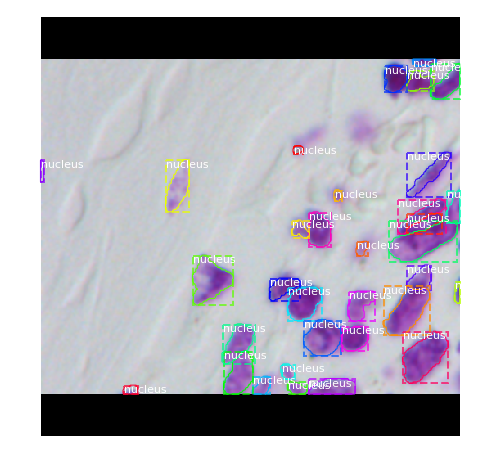

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  240.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


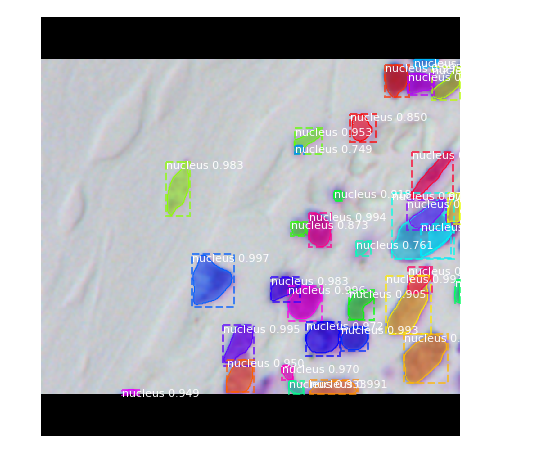

In [15]:
# Test on a random train image
image_id = random.choice(train_data.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(train_data, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            train_data.class_names, figsize=(8, 8))

# mask, class_ids = train_data.load_mask(image_id)
# visualize.display_top_masks(original_image, mask, class_ids, train_data.class_names, limit=1)

results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())

original_image           shape: (512, 512, 3)         min:    0.00000  max:  151.00000
image_meta               shape: (10,)                 min:    0.00000  max:  696.00000
gt_class_id              shape: (101,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (101, 4)              min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 101)       min:    0.00000  max:  255.00000
img size:(512, 512, 3)
mask size:(512, 512, 101)


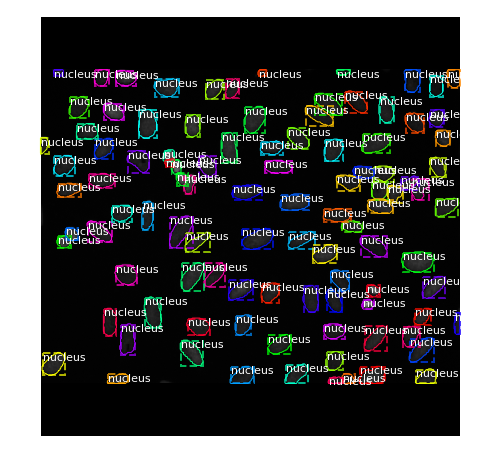

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  151.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   47.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


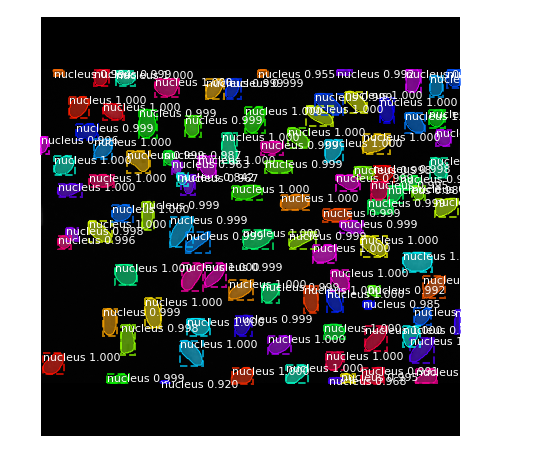

In [19]:
# Test on a random validation image
image_id = random.choice(val_data.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_data, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

print("img size:{}".format(original_image.shape))
print("mask size:{}".format(gt_mask.shape))

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            val_data.class_names, figsize=(8, 8))


results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            val_data.class_names, r['scores'], ax=get_ax())



52
{'image': {'checksum': '60e58d0b01c10ce966f805e8ef879c09', 'pathname': '505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81.png', 'shape': {'r': 512, 'c': 640, 'channels': 3}}, 'objects': []}
original shape:(512, 640, 3)
resized shape:(512, 512, 3), scale:0.8, padding:[(51, 51), (0, 0), (0, 0)]


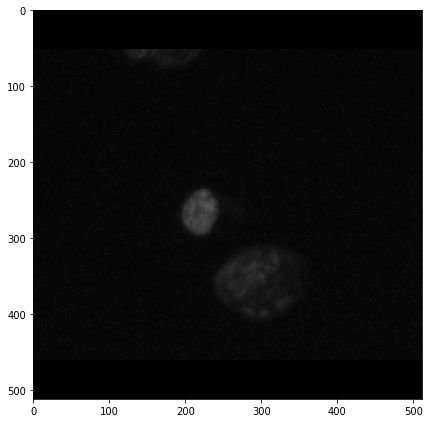

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:   97.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   -6.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


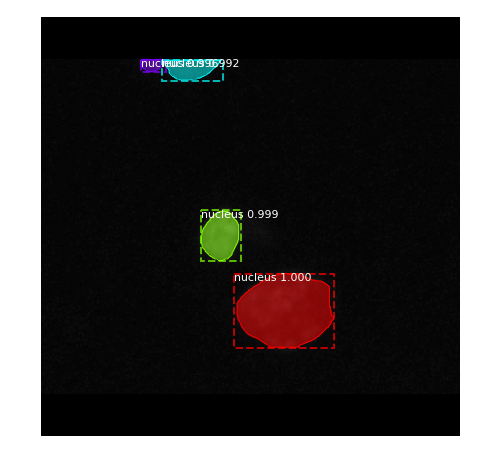

mask shape:(512, 512, 1)
(512, 410, 1)


In [11]:
# Test on a random test image

i = random.randint(0, len(test_set)-1)
print(i)
test = test_set[10]
print(test)
test_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
print("original shape:{}".format(test_img.shape))
test_img,_, scale,padding = resize_image(test_img, min_dim=512,max_dim=512, padding=True)
print("resized shape:{}, scale:{}, padding:{}".format(test_img.shape,scale, padding))
plt.figure(figsize=(6,6))
imshow(test_img)
plt.show()

results = model.detect([test_img], verbose=1)
r = results[0]
visualize.display_instances(test_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())
first_mask = r['masks'][:,:,0]
first_mask = np.expand_dims(first_mask, axis=2)
print('mask shape:{}'.format(first_mask.shape))
print(resize_mask(first_mask, scale, padding).shape)

In [20]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
# image_ids = np.random.choice(val_data.image_ids, 65)
APs = []
half_APs = []
for i, image_id in tqdm(enumerate(val_data.image_ids), total = len(val_data.image_ids)):
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(val_data, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    # Compute AP
    for iou in [0.5, 0.55, 0.6, 0.65, 0.7,0.75, 0.8,0.85, 0.9,0.95]:
        AP, _, _, _ =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=iou)
        
        APs.append(AP)
        if iou == 0.5:
            half_APs.append(AP)
    
print("0.5-0.95 mAP: ", np.mean(APs))
print("0.5 mAP: ", np.mean(half_APs))

100%|██████████| 67/67 [03:03<00:00,  2.73s/it]

0.5-0.95 mAP:  0.6187069247052938
0.5 mAP:  0.8738422786820643


origin_size:(256, 256, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:   17.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000
(512, 512, 11)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:38: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and


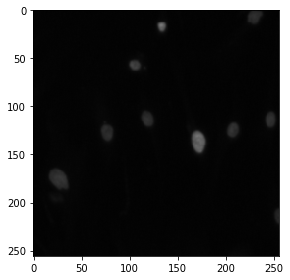

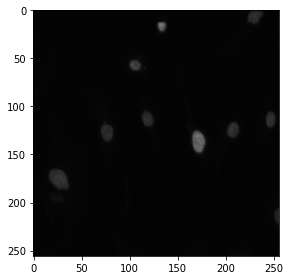

(512, 512)


/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:33: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


In [7]:
i = 0
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']


revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

print(masks.shape)
imshow(revert_img)
plt.show()

imshow(origin_img)
plt.show()
print(masks[:,:,0].shape)


for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
        
        
# for i in range(masks.shape[-1]):
#     print(masks[:,:,i].shape)
#     print(revert_resizing(masks[:,:,i], scale, padding).shape)
#     imshow(np.squeeze(masks[:,:,i]))
#     plt.show()

origin_size:(512, 640, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  138.00000
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   34.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


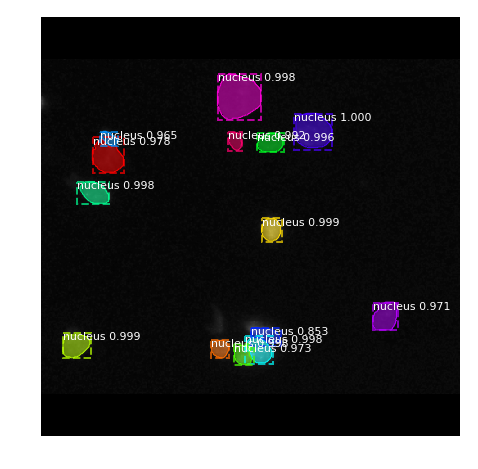

/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:40: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:34: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/keven/miniconda3/envs/tensorflow/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data 

14


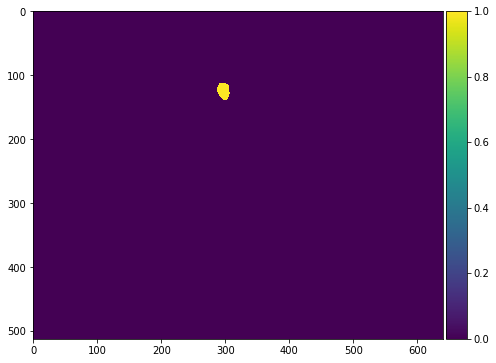

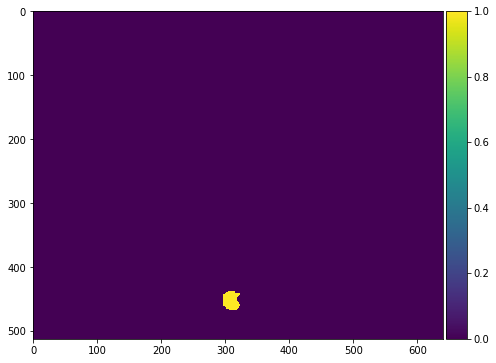

(array([], dtype=int64), array([], dtype=int64))


In [11]:
# debug image
i = 2
# testing revert_resizing
img_data = test_set[i]
origin_img = imread(os.path.join(base_dir, 'images', img_data['image']['pathname']))
origin_size = origin_img.shape
print("origin_size:{}".format(origin_size))
resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)

results = model.detect([resized_img], verbose=1)
masks = results[0]['masks']
r = results[0]
visualize.display_instances(resized_img, r['rois'], r['masks'], r['class_ids'], 
                            train_data.class_names, r['scores'], ax=get_ax())



revert_img = revert_resizing_3d(resized_img, origin_size, padding)

assert(revert_img.shape == origin_img.shape)

reverted_masks = []
for i in range(masks.shape[-1]):
    mask = masks[:,:, i]
    reverted = revert_resizing(mask, origin_size, padding)
    reverted_masks.append(reverted)


# inter = reverted_masks[2]*reverted_masks[5]
# print(np.nonzero(inter))



print(len(reverted_masks))
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[8]))
plt.show()
plt.figure(figsize=(7,7))
imshow(np.squeeze(reverted_masks[10]))
plt.show()

inter = reverted_masks[8]*reverted_masks[10]
print(np.nonzero(inter))
row, col = np.nonzero(inter)
if len(row)>0:
    reverted_masks[8][row, col] = 0
# for i in range(len(reverted_masks)):
#     for j in range(i+1,len(reverted_masks)):
#         print("i:{}, j:{}".format(i,j))
#         inter = reverted_masks[i]*reverted_masks[j]
#         assert(len(np.nonzero(inter)[0]) == 0)


In [12]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

in total 65 images to predict


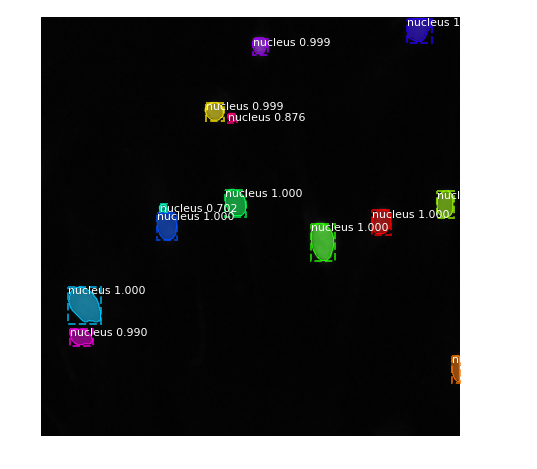

13 masks detected, lowest score is 0.7022184133529663


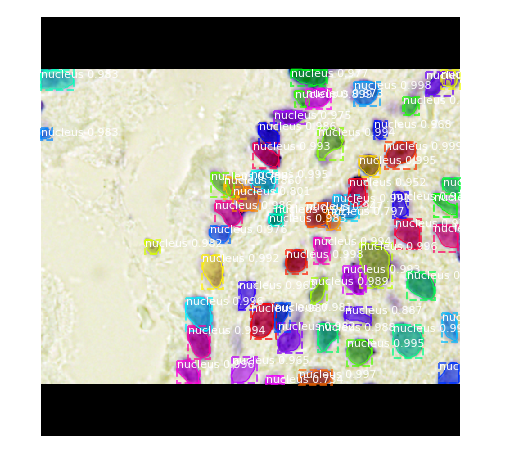

57 masks detected, lowest score is 0.7343618869781494


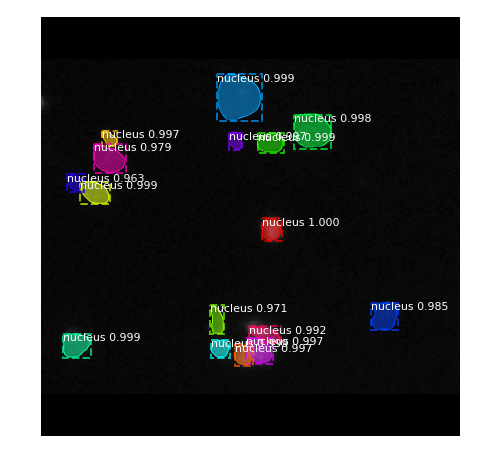

16 masks detected, lowest score is 0.9627618193626404


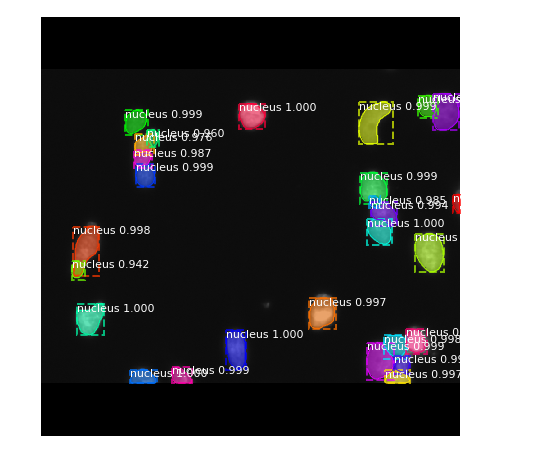

27 masks detected, lowest score is 0.9416436553001404


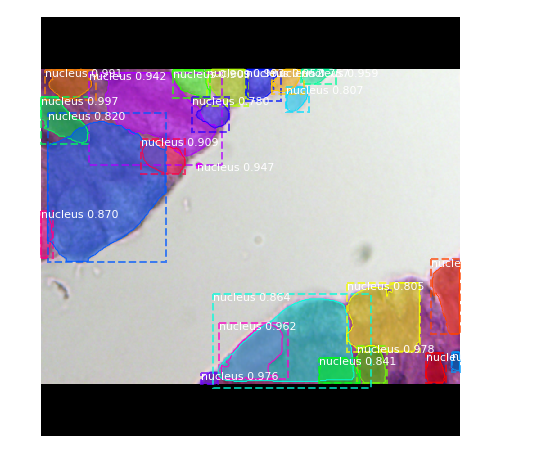

23 masks detected, lowest score is 0.7573719620704651


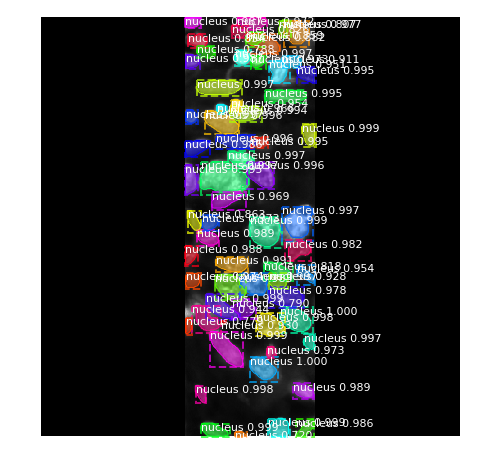

63 masks detected, lowest score is 0.7196050882339478


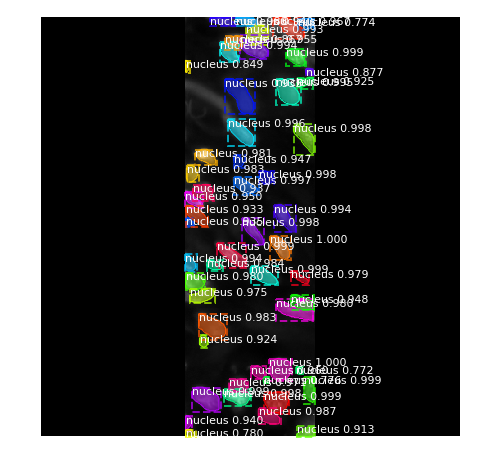

52 masks detected, lowest score is 0.7723329067230225


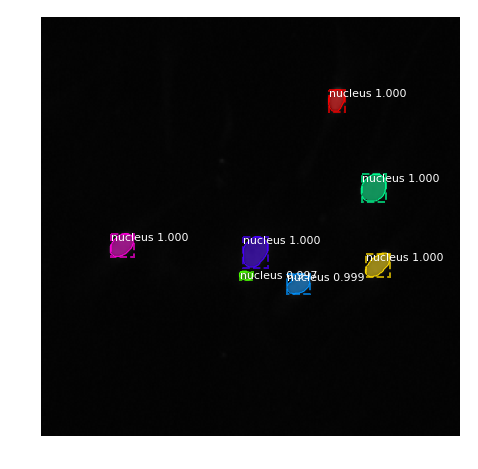

7 masks detected, lowest score is 0.9970166683197021


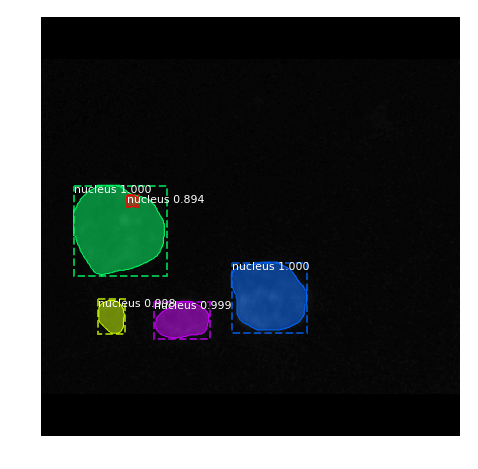

5 masks detected, lowest score is 0.894192636013031


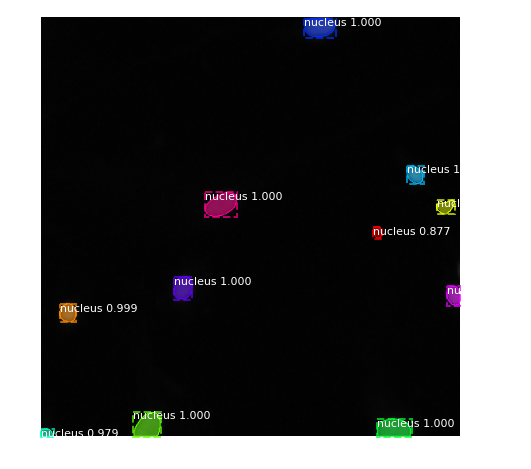

11 masks detected, lowest score is 0.8774439692497253


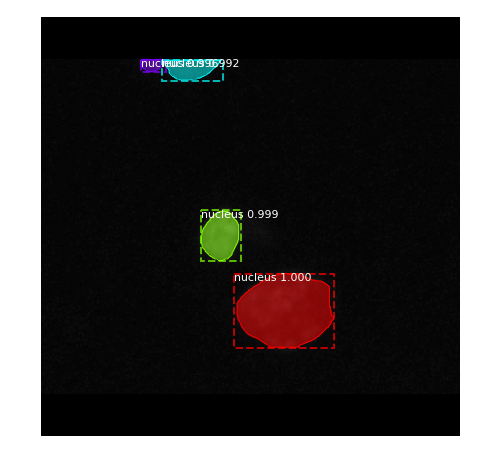

4 masks detected, lowest score is 0.9915197491645813


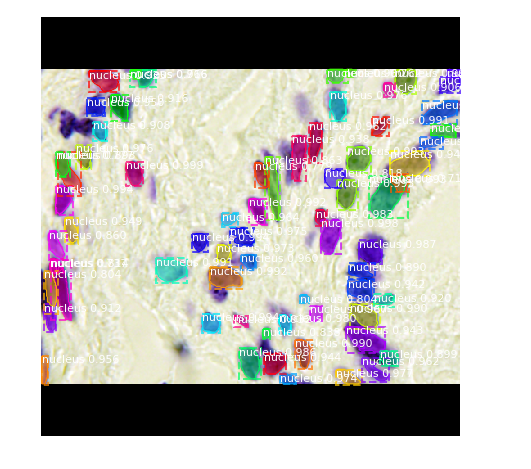

68 masks detected, lowest score is 0.7177279591560364


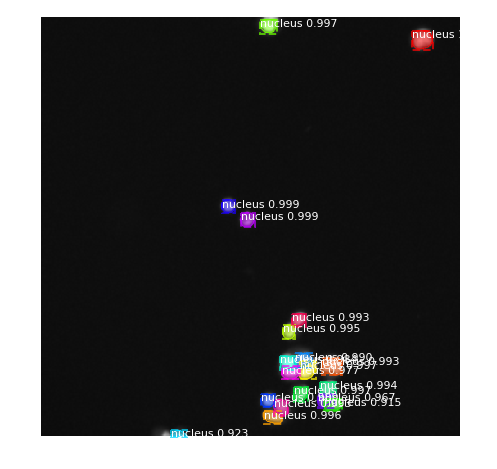

19 masks detected, lowest score is 0.9148057103157043


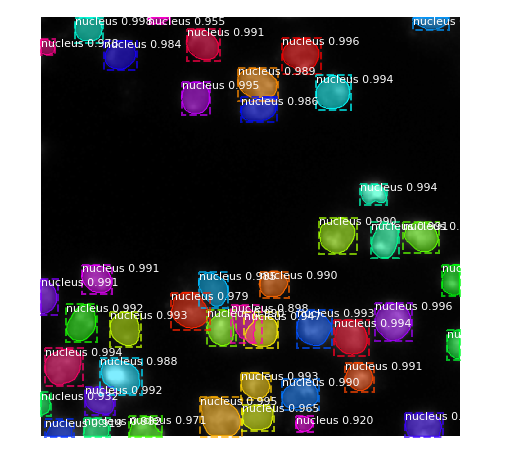

44 masks detected, lowest score is 0.8980447053909302


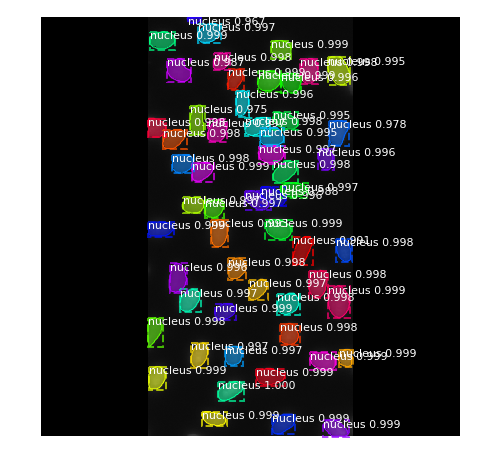

55 masks detected, lowest score is 0.966888964176178


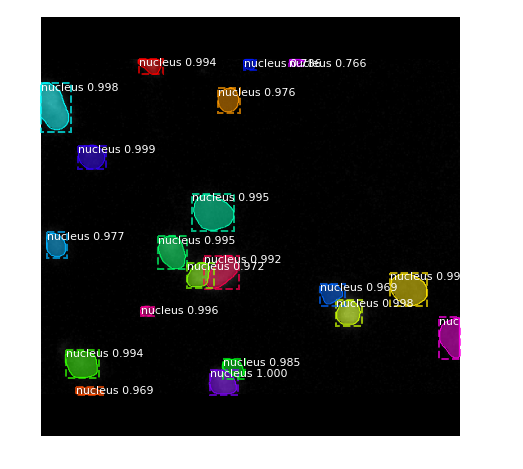

20 masks detected, lowest score is 0.7661340832710266


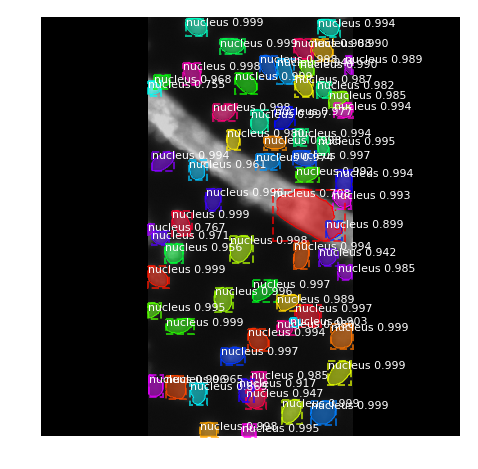

65 masks detected, lowest score is 0.7078425288200378


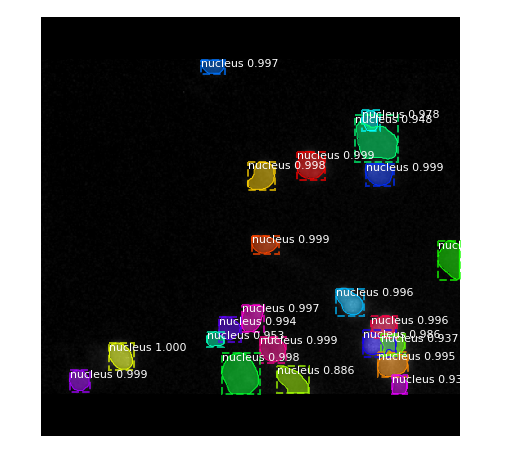

22 masks detected, lowest score is 0.8858628869056702


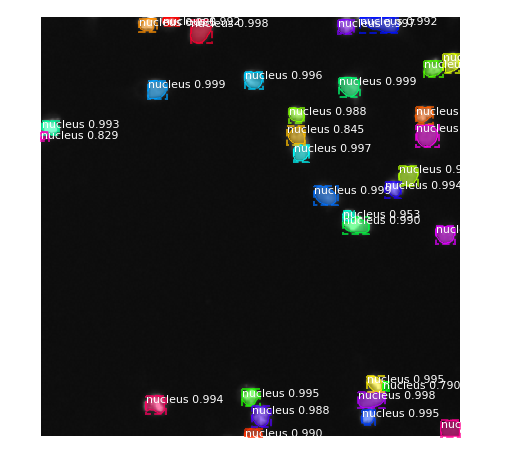

32 masks detected, lowest score is 0.7896251678466797


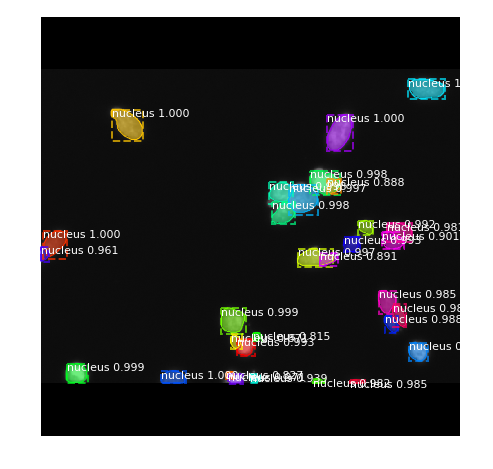

31 masks detected, lowest score is 0.8148320317268372


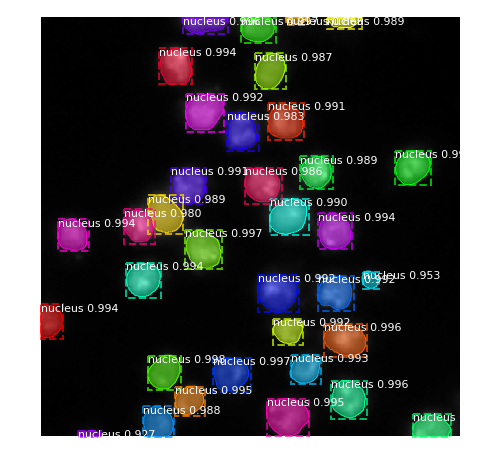

35 masks detected, lowest score is 0.8654835820198059


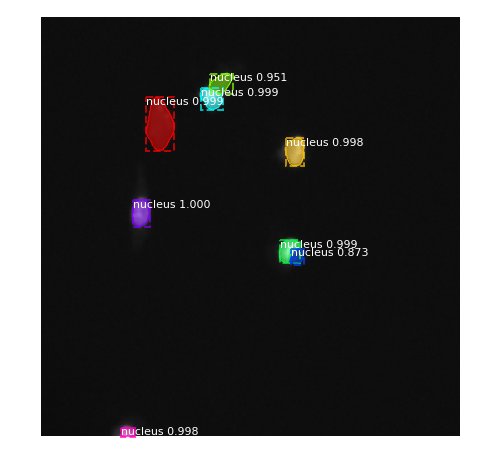

8 masks detected, lowest score is 0.8734930753707886


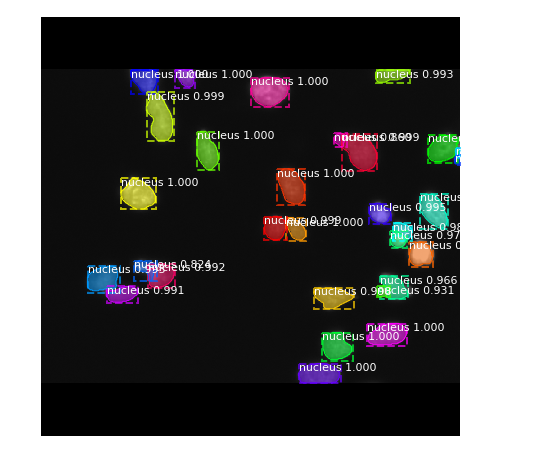

30 masks detected, lowest score is 0.7452467679977417


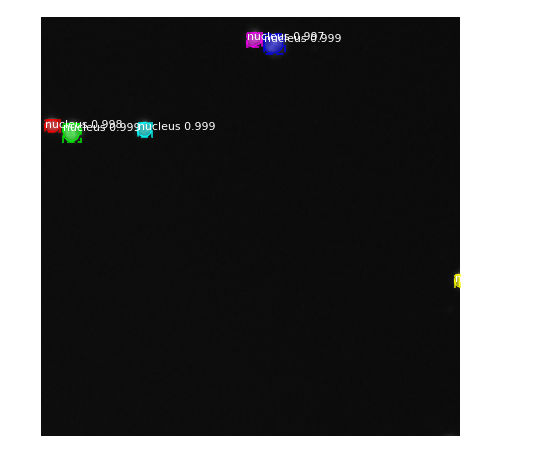

6 masks detected, lowest score is 0.9438148140907288


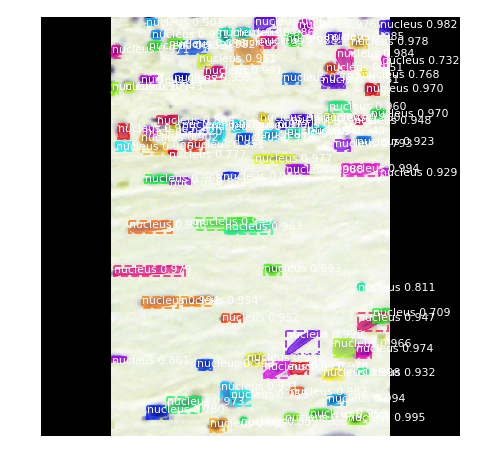

91 masks detected, lowest score is 0.708737850189209


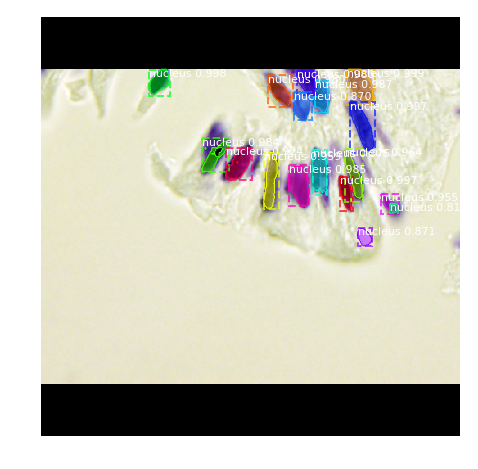

17 masks detected, lowest score is 0.8155292272567749


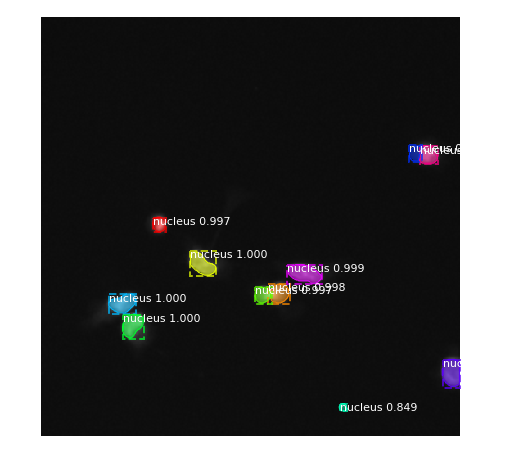

11 masks detected, lowest score is 0.8492982387542725


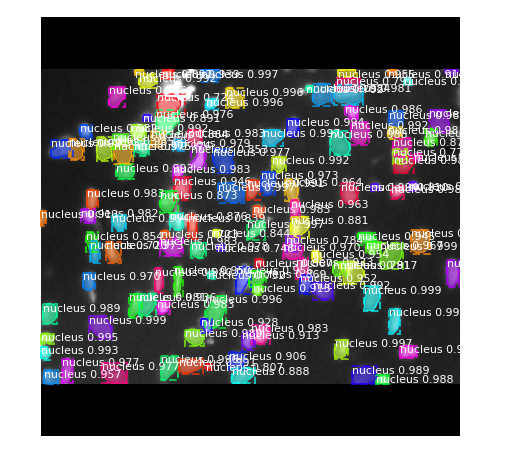

122 masks detected, lowest score is 0.7018495798110962


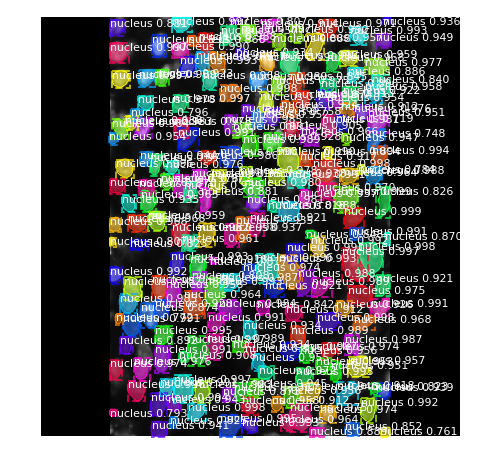

207 masks detected, lowest score is 0.7194963097572327


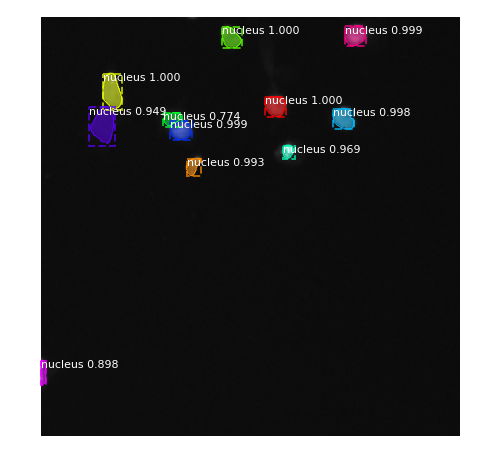

11 masks detected, lowest score is 0.7740510702133179


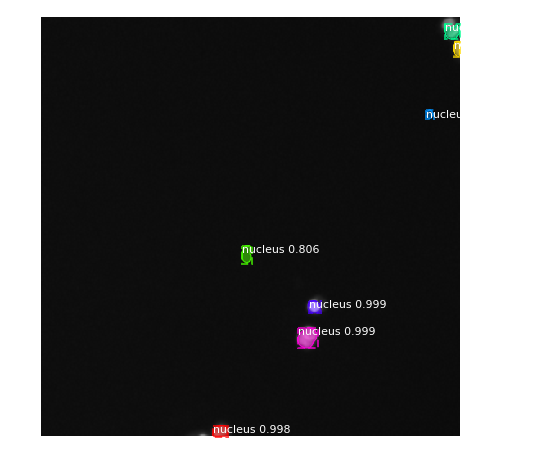

7 masks detected, lowest score is 0.8062760233879089


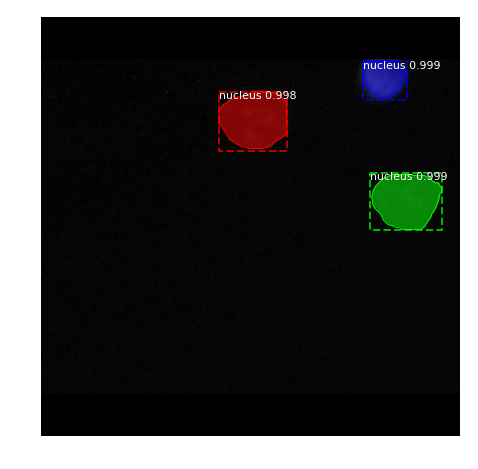

3 masks detected, lowest score is 0.9982374906539917


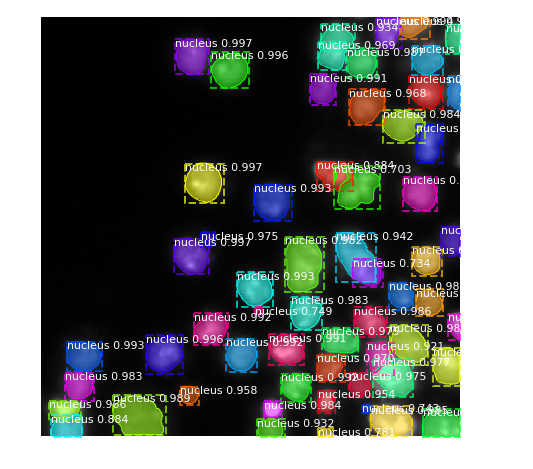

59 masks detected, lowest score is 0.7025451064109802


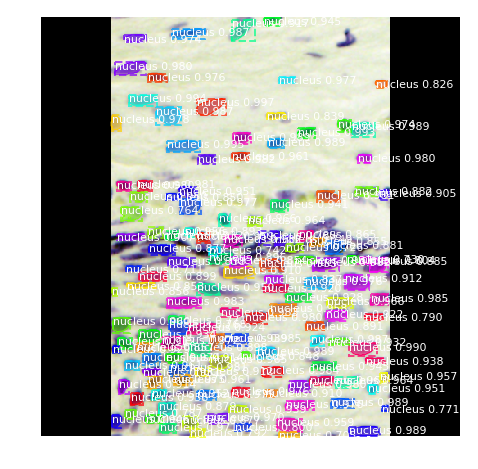

134 masks detected, lowest score is 0.7048142552375793


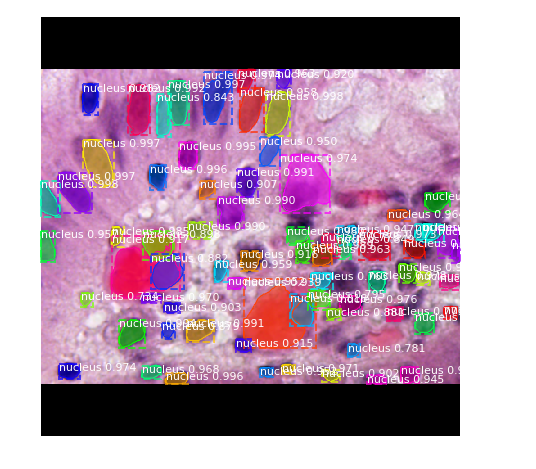

71 masks detected, lowest score is 0.7136854529380798


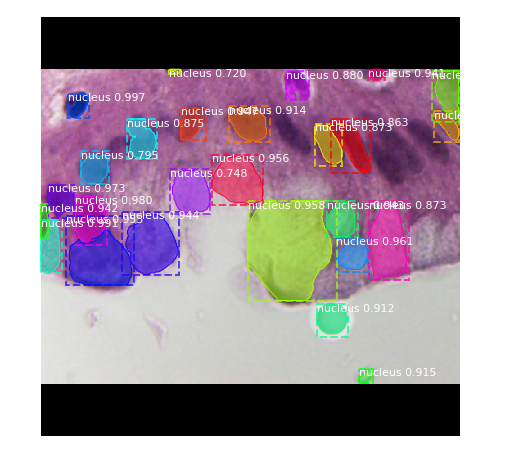

26 masks detected, lowest score is 0.7090603709220886


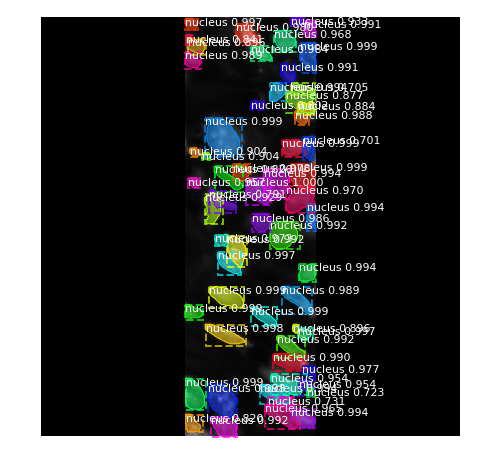

59 masks detected, lowest score is 0.7014368176460266


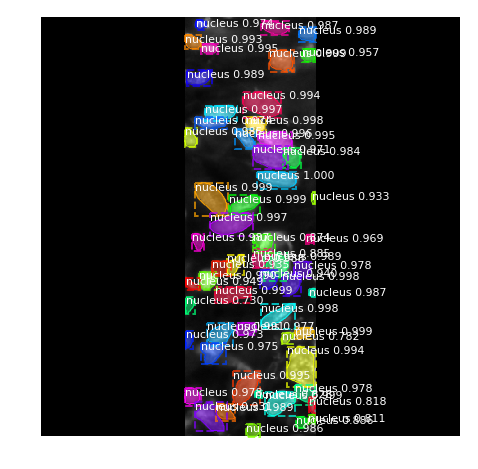

56 masks detected, lowest score is 0.7301383018493652


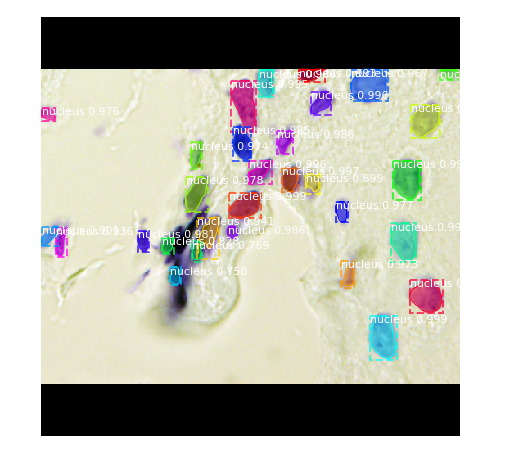

30 masks detected, lowest score is 0.7503650188446045


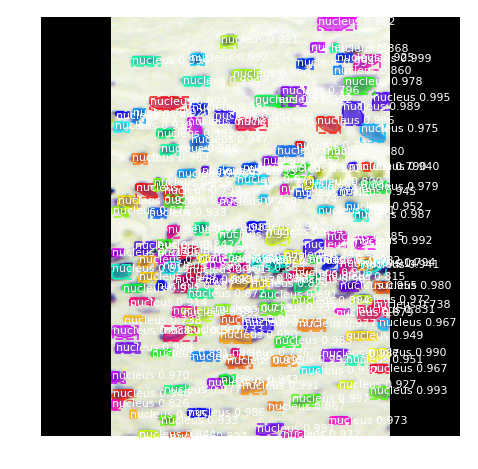

157 masks detected, lowest score is 0.7083773016929626


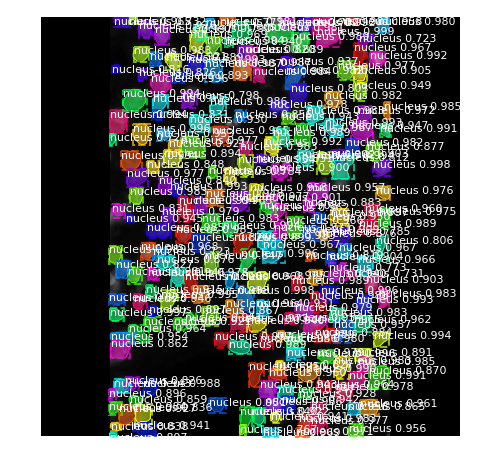

220 masks detected, lowest score is 0.7228558659553528


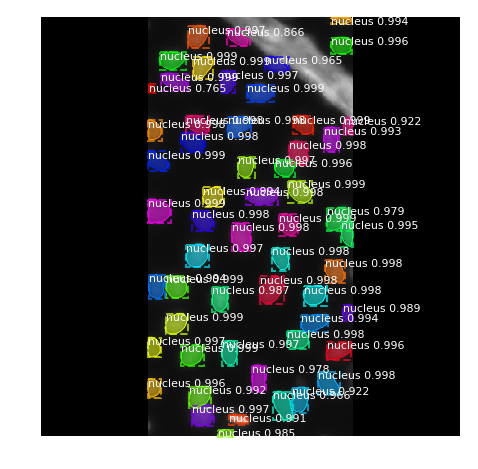

56 masks detected, lowest score is 0.7653810977935791


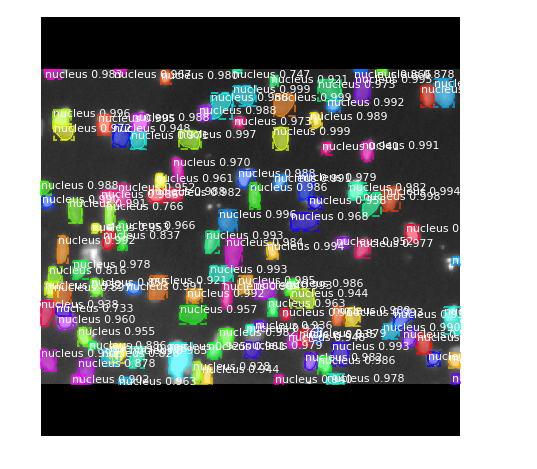

114 masks detected, lowest score is 0.7330945134162903


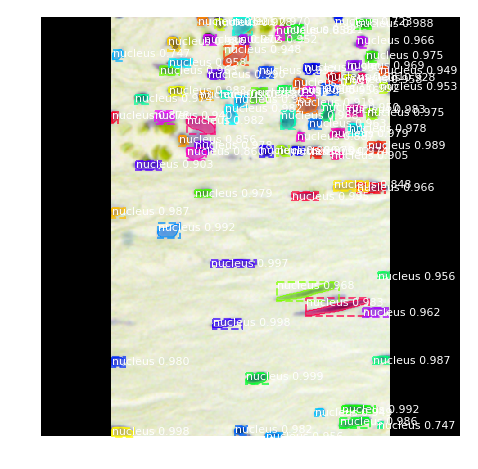

80 masks detected, lowest score is 0.7230210900306702


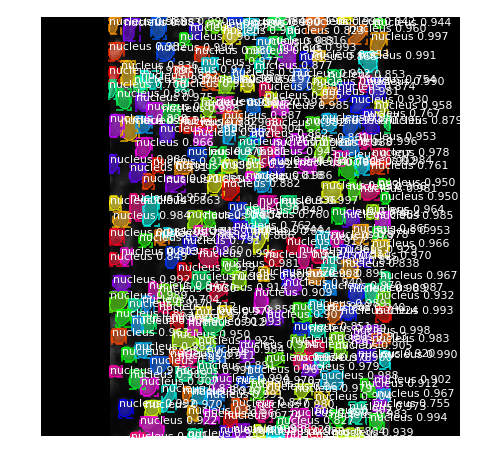

254 masks detected, lowest score is 0.7000679969787598


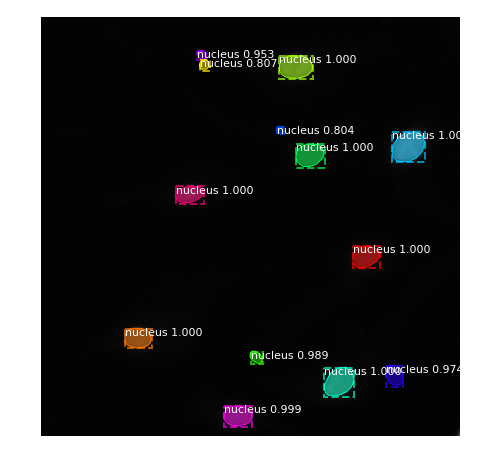

13 masks detected, lowest score is 0.804154634475708


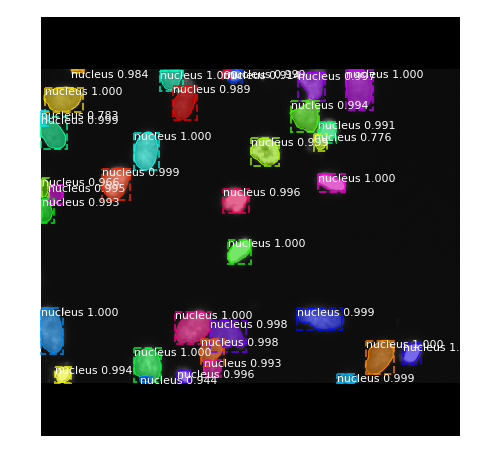

35 masks detected, lowest score is 0.7762548327445984


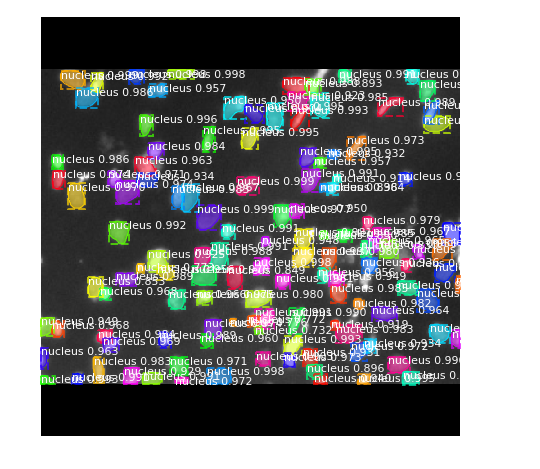

124 masks detected, lowest score is 0.7321939468383789


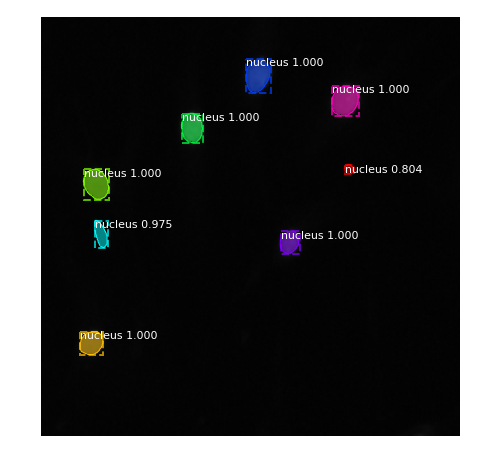

8 masks detected, lowest score is 0.8044629096984863


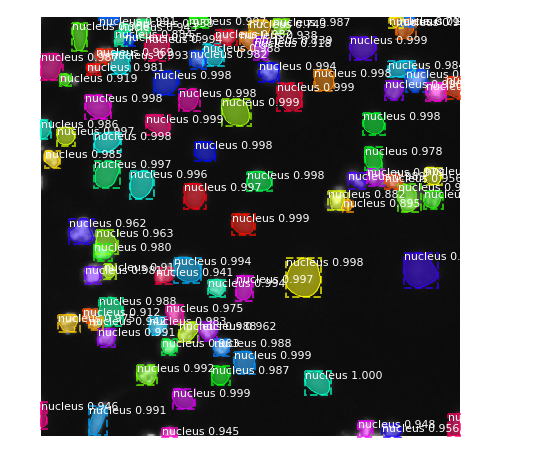

91 masks detected, lowest score is 0.7173345685005188


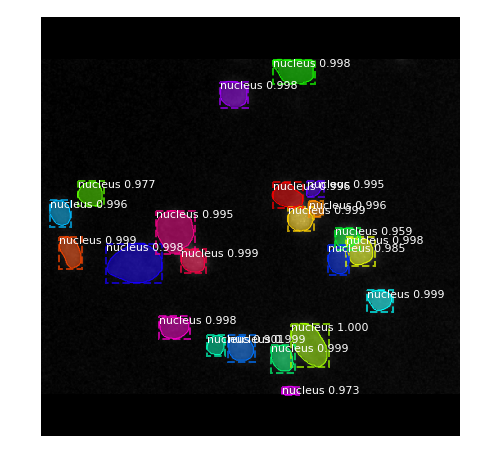

22 masks detected, lowest score is 0.9013577103614807


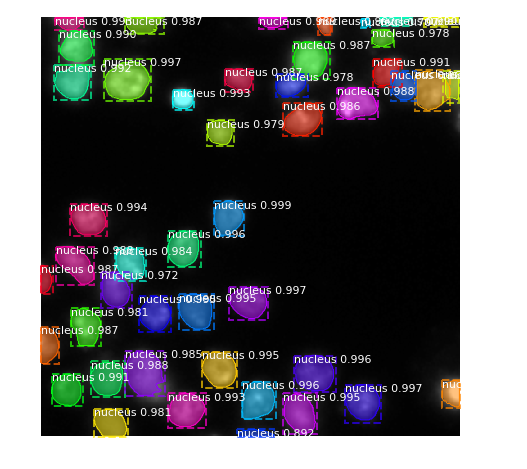

46 masks detected, lowest score is 0.7072617411613464


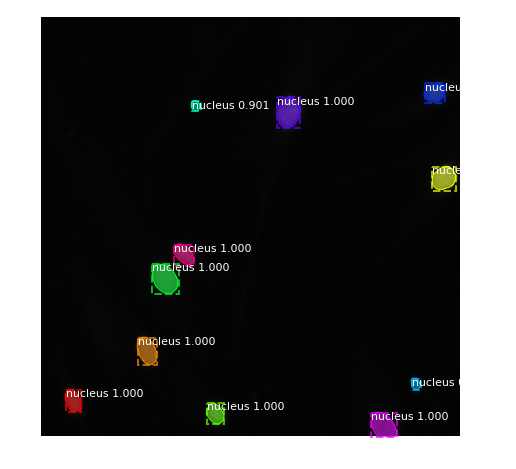

11 masks detected, lowest score is 0.9008855223655701


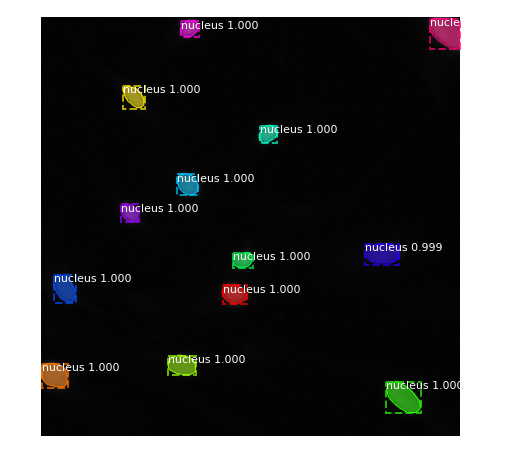

13 masks detected, lowest score is 0.9991708993911743


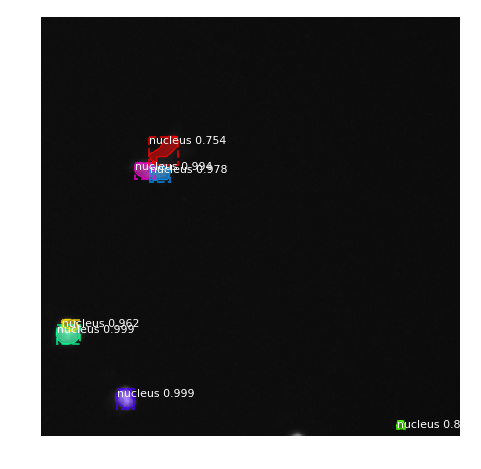

7 masks detected, lowest score is 0.7542580366134644


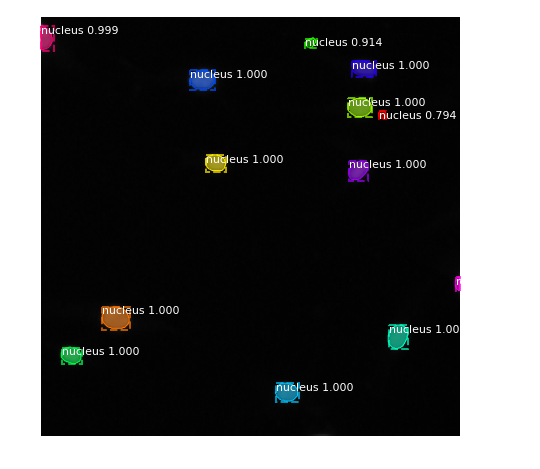

13 masks detected, lowest score is 0.7942993640899658


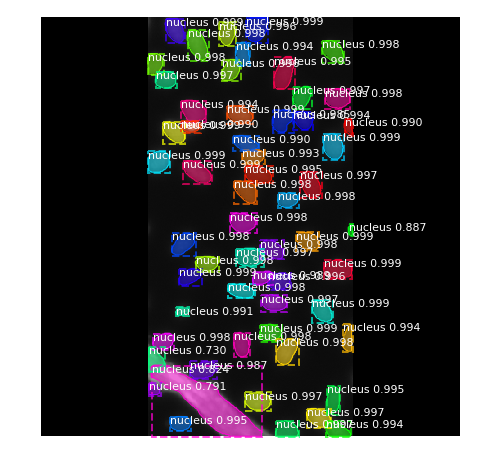

58 masks detected, lowest score is 0.7304140329360962


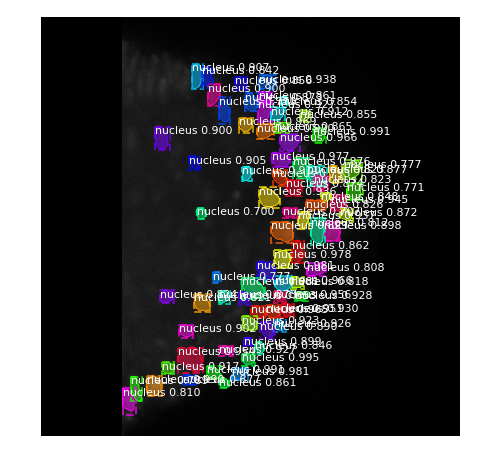

74 masks detected, lowest score is 0.7001214027404785


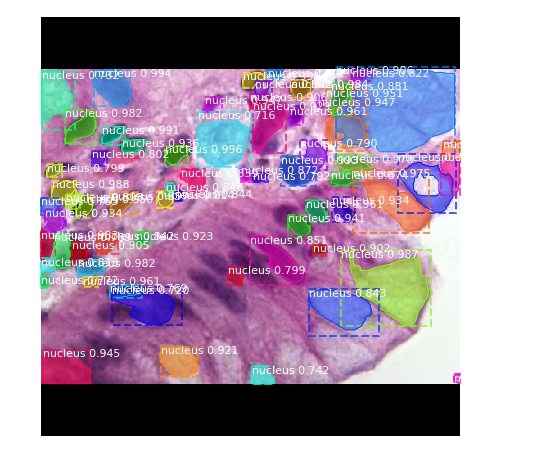

65 masks detected, lowest score is 0.7160232067108154


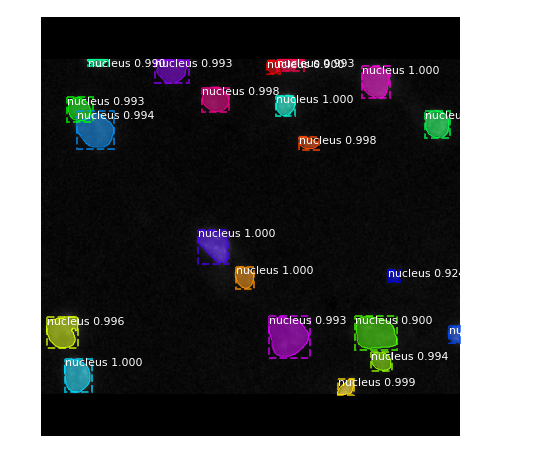

21 masks detected, lowest score is 0.9001156687736511


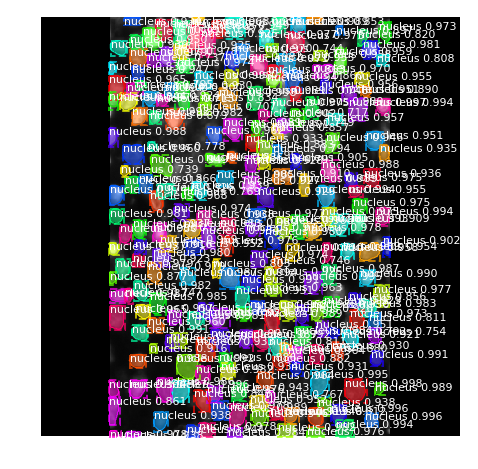

235 masks detected, lowest score is 0.7023836374282837


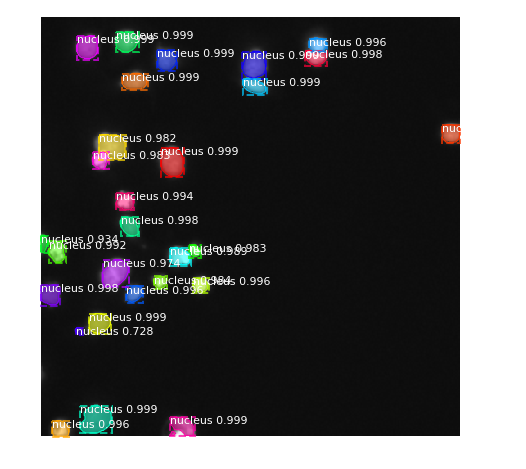

28 masks detected, lowest score is 0.7279335260391235


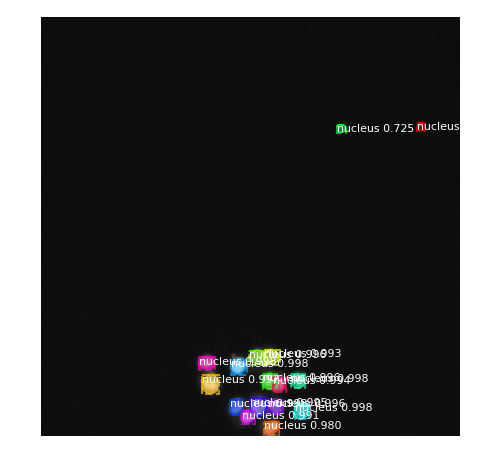

16 masks detected, lowest score is 0.718517541885376


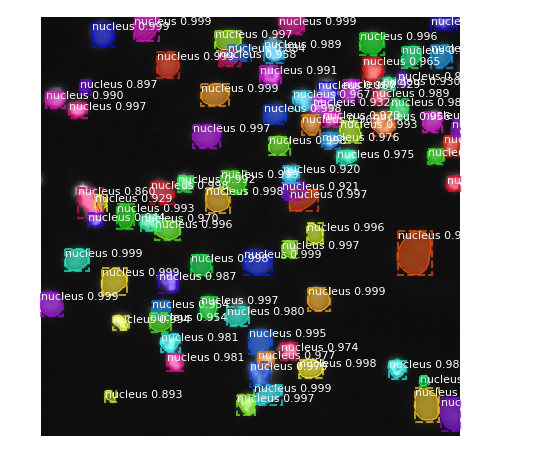

82 masks detected, lowest score is 0.8598348498344421


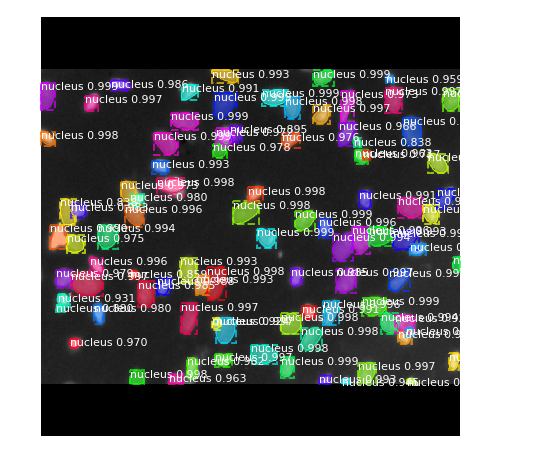

91 masks detected, lowest score is 0.7169739007949829
submision file completed!


In [21]:
import warnings
warnings.filterwarnings('ignore')


# Run-length encoding stolen from https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# convert single mask shape (h,w) into a list, 1: foreground, 0: background
def rle_encoding(x, total_pixel):
#     total = x.T.flatten().shape[0]
    dots = np.where(x.T.flatten() == 1)[0]
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

def single_image(test):
    lines = []
    image_id =  test['image']['pathname']
    origin_img = imread(os.path.join(base_dir, 'images', test['image']['pathname']))
#     print("origin image shape:{}".format(origin_img.shape))
    resized_img,_, scale,padding = resize_image(origin_img, min_dim=512,max_dim=512, padding=True)
#     print("handing img:{}, scale:{}, padding:{}".format(image_id, scale, padding))


    results = model.detect([resized_img], verbose=0)
    scores = results[0]['scores']
    masks = results[0]['masks']
    visualize.display_instances(resized_img, results[0]['rois'], masks, results[0]['class_ids'], 
                            train_data.class_names, scores, ax=get_ax())
    s0 = 1
    for s in scores:
        if s< s0:
            s0 = s
    print("{} masks detected, lowest score is {}".format(masks.shape[-1], s0))
    
    reverted_masks = []
    for i in range(masks.shape[-1]):
        mask = masks[:,:,i]
        reverted_mask = revert_resizing(mask, origin_img.shape, padding)
        assert(reverted_mask.shape[0] == origin_img.shape[0])
        assert(reverted_mask.shape[1] == origin_img.shape[1])
        reverted_masks.append(reverted_mask)
    
    for i in range(len(reverted_masks)):
        for j in range(i+1, len(reverted_masks)):
            interaction = reverted_masks[i]*reverted_masks[j]
            row, col = np.nonzero(interaction)
            if len(row)>0:
#                 print("before, {} pixels overlapping between mask {} and {}".format(len(row), i, j))
                reverted_masks[i][row, col] = 0
#                 print("after, {} pixels overlapping".format(len(np.nonzero(reverted_masks[i]*reverted_masks[j])[0])))
                
    
    for i in range(len(reverted_masks)):
        assert(reverted_masks[i].shape[0] == origin_img.shape[0])
        assert(reverted_masks[i].shape[1] == origin_img.shape[1])
        rle = rle_encoding(reverted_masks[i], origin_img.shape[0]*origin_img.shape[1])
        lines.append("{},{}".format(image_id[:-4],' '.join(map(str, rle))))
    return lines

base_dir = '../DSB2018'
test_set = load_testset(os.path.join(base_dir, 'test.json'))
print("in total {} images to predict".format(len(test_set)))
with open('sub_baseline_res101_heads_all_aug.csv', 'w') as f: 
    f.write('ImageId,EncodedPixels\n')
    for i, test in enumerate(test_set):
        lines = single_image(test)
        for line in lines:
            if line.endswith(','):
                print("no pixel in mask:{}".format(line))
                continue
            f.write(line)
            f.write('\n')
    
print("submision file completed!")

In [14]:
print(len(test_set))

65


In [12]:
import numpy as np
a = np.array([[1,1,0], [0,0,0], [1,0,0]])
b = np.array([[0,0,0], [0,0,0], [0,0,0]])
print(a*b)
len(np.nonzero(a*b)[0]) == 0

[[0 0 0]
 [0 0 0]
 [0 0 0]]


True

In [21]:
for i in range(1, 10):
    print(i)

1
2
3
4
5
6
7
8
9


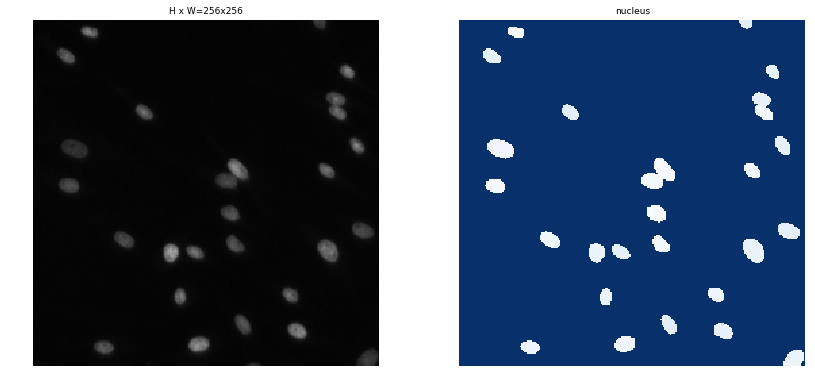

orignal shape:(256, 256, 3), (256, 256, 27)
resized shape:(512, 512, 3), (512, 512, 27)


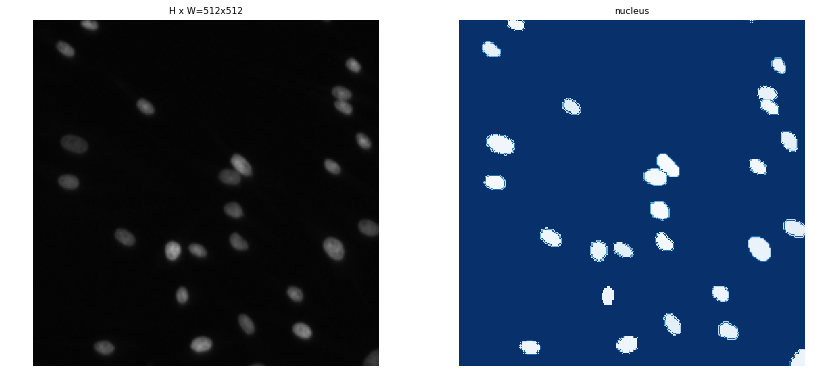

[516 500 500   3   0   0 512 512   1   1]


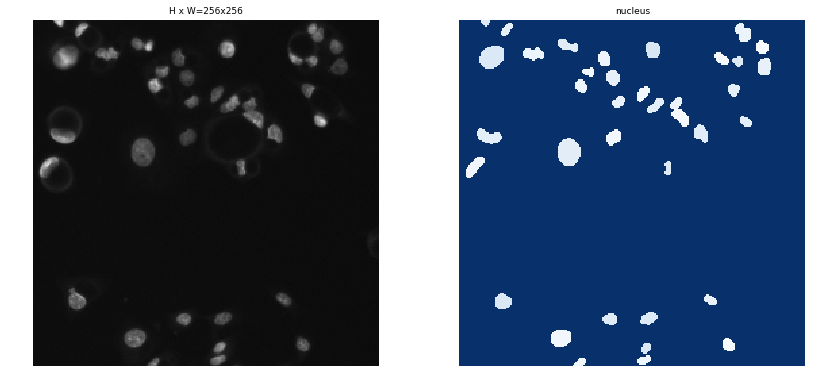

orignal shape:(256, 256, 3), (256, 256, 39)
resized shape:(512, 512, 3), (512, 512, 39)


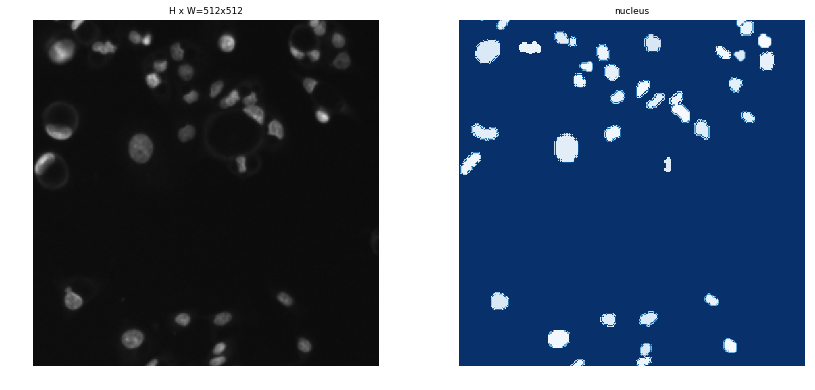

[ 10 500 500   3   0   0 512 512   1   1]


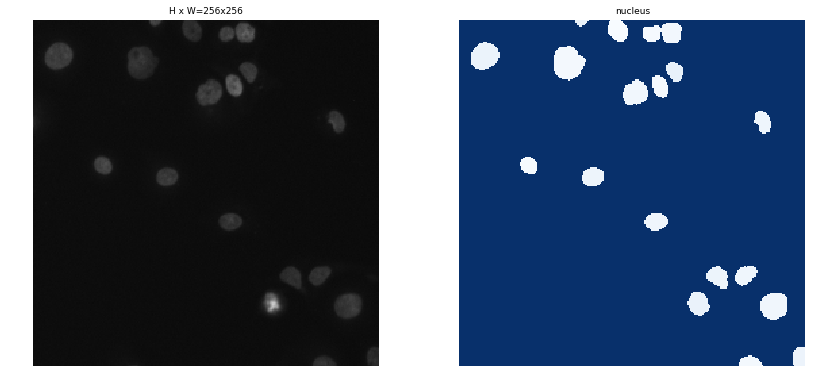

orignal shape:(256, 256, 3), (256, 256, 19)
resized shape:(512, 512, 3), (512, 512, 19)


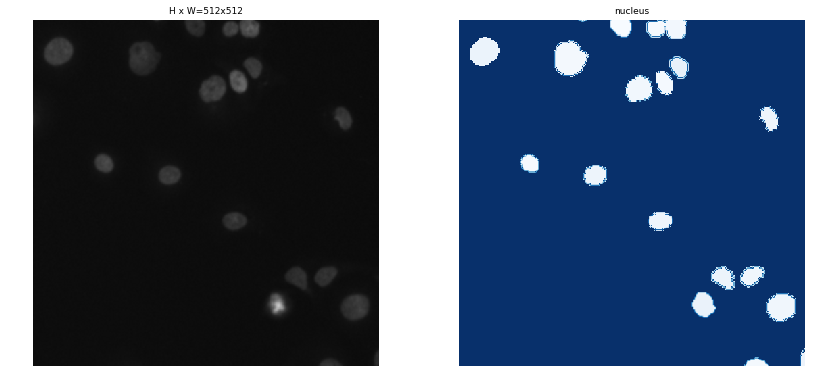

[191 500 500   3   0   0 512 512   1   1]


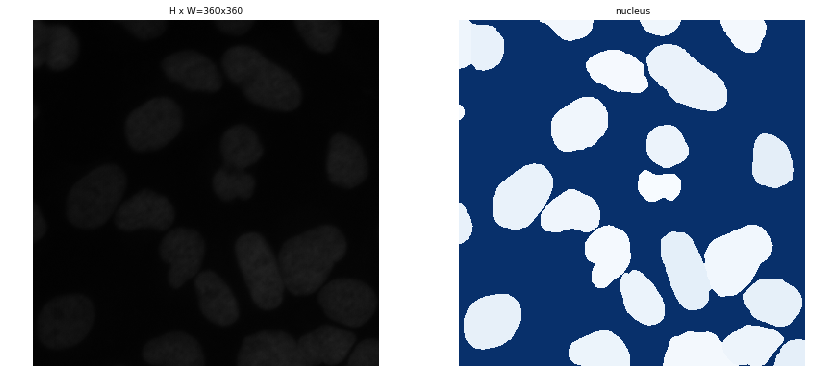

orignal shape:(360, 360, 3), (360, 360, 25)
resized shape:(720, 720, 3), (720, 720, 25)


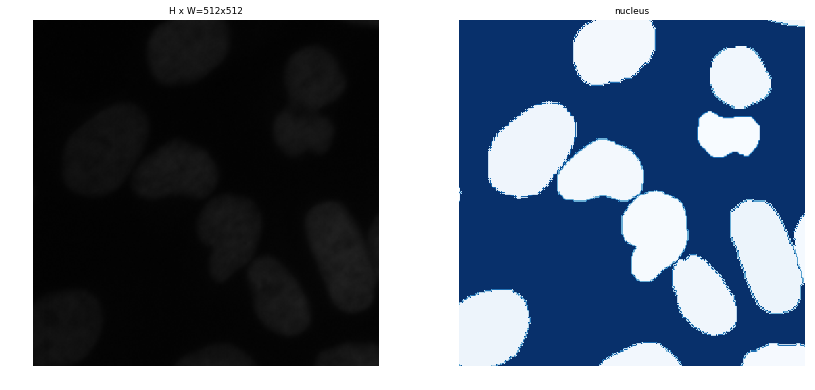

[163 500 500   3   0   0 512 512   1   1]


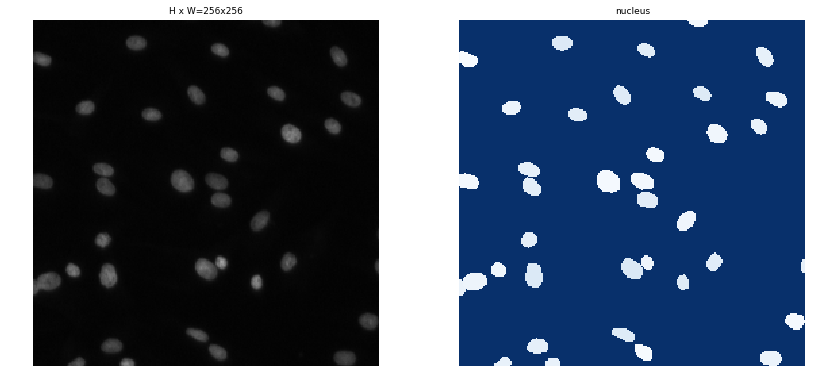

orignal shape:(256, 256, 3), (256, 256, 37)
resized shape:(512, 512, 3), (512, 512, 37)


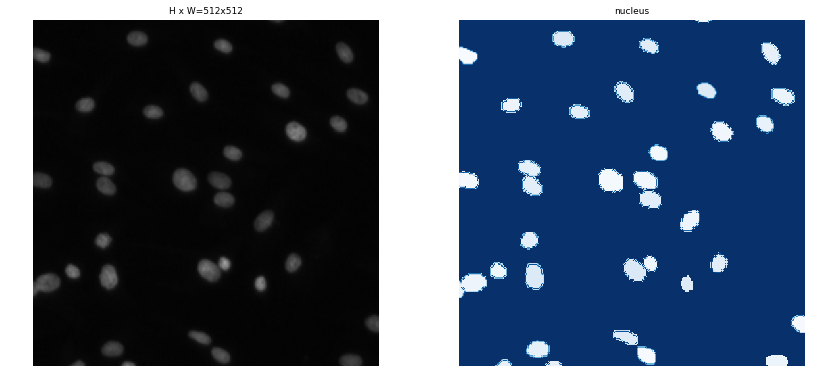

[400 500 500   3   0   0 512 512   1   1]


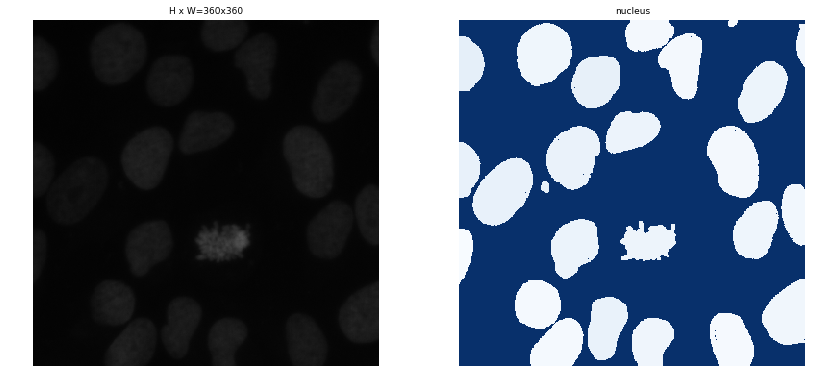

orignal shape:(360, 360, 3), (360, 360, 23)
resized shape:(720, 720, 3), (720, 720, 23)


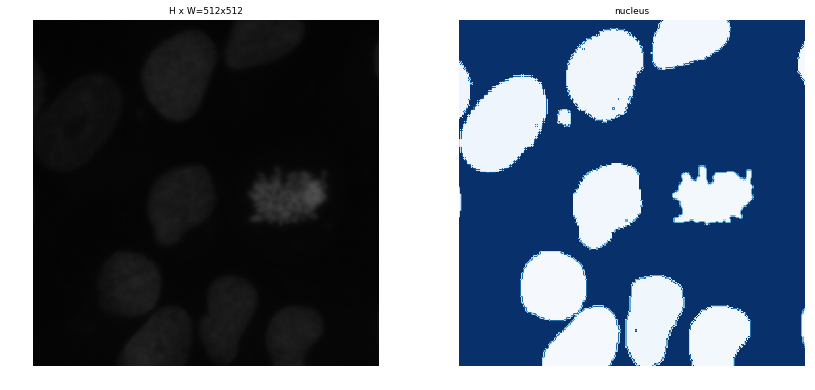

[ 18 500 500   3   0   0 512 512   1   1]


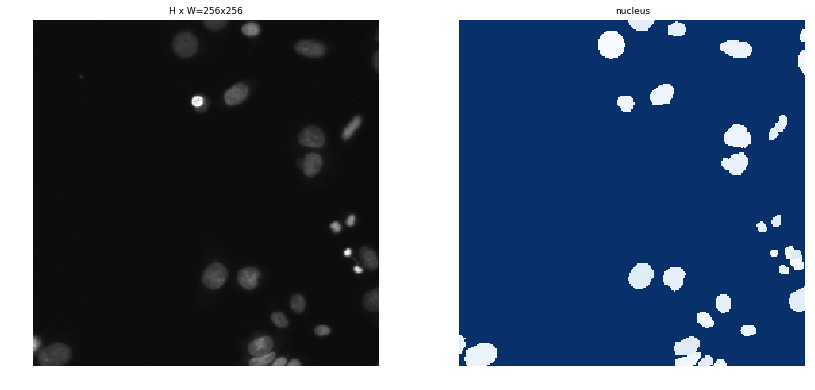

orignal shape:(256, 256, 3), (256, 256, 32)
resized shape:(512, 512, 3), (512, 512, 32)


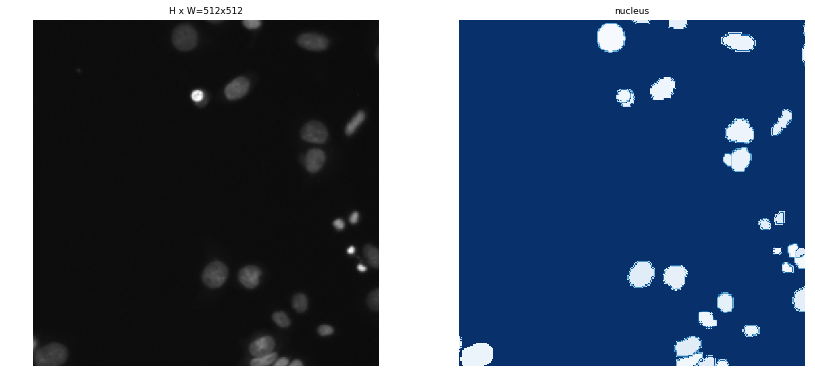

[341 500 500   3   0   0 512 512   1   1]


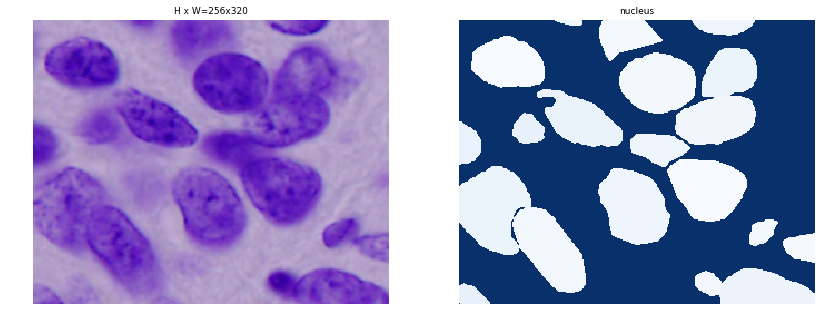

orignal shape:(256, 320, 3), (256, 320, 20)
resized shape:(512, 640, 3), (512, 640, 20)


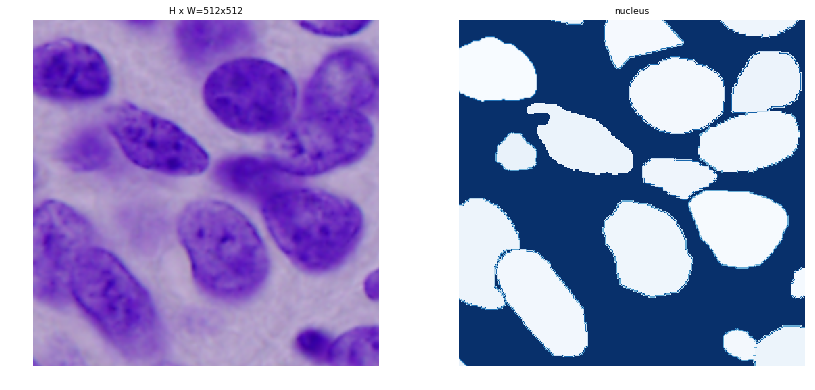

[458 500 500   3   0   0 512 512   1   1]


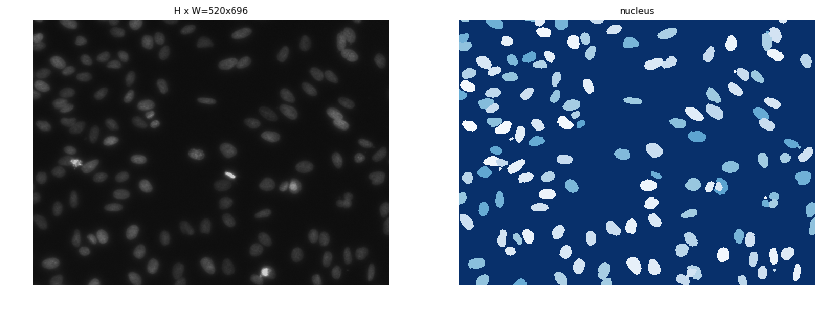

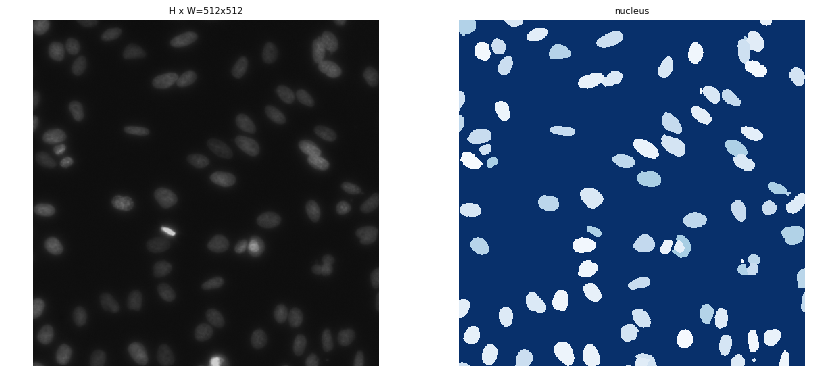

[578 500 500   3   0   0 512 512   1   1]


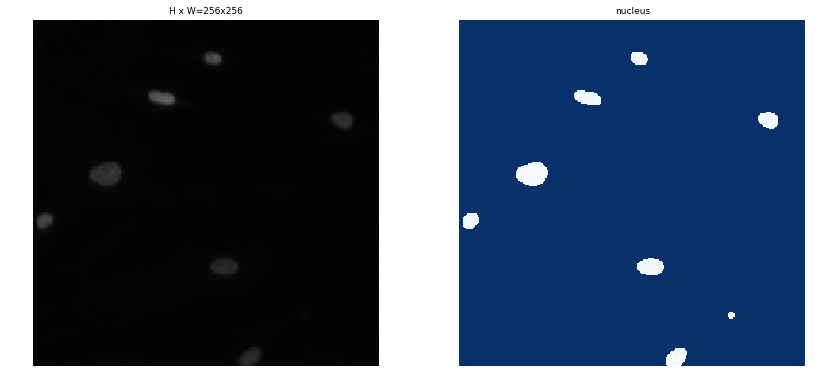

orignal shape:(256, 256, 3), (256, 256, 8)
resized shape:(512, 512, 3), (512, 512, 8)


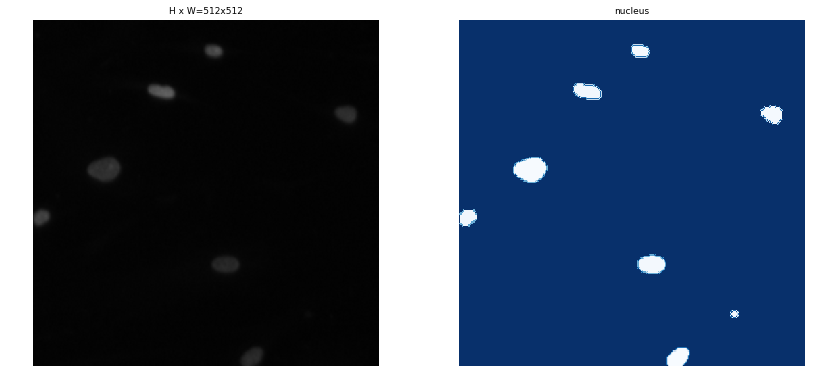

[286 500 500   3   0   0 512 512   1   1]


In [4]:
class Test2018Config(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "DSB2018"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 3 shapes

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    
    USE_MINI_MASK = True
    
    #MINI_MASK_SHAPE = (112, 112)  # (height, width) of the mini-mask


    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64,128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    
    #TODO: in trainning time, set both of these two as 100 and change to 200 during predication time!
    TRAIN_ROIS_PER_IMAGE = 400
    
    #RPN_TRAIN_ANCHORS_PER_IMAGE = 512

    #RPN_NMS_THRESHOLD = 0.7
    
    DETECTION_MAX_INSTANCES = 250
    
    MAX_GT_INSTANCES = 300

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 304

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 36
    
    DETECTION_MIN_CONFIDENCE = 0.7

test_config = Test2018Config()



def data_augmentation(input_image, masks,
                      h_flip=True,
                      v_flip=True,
                      rotation=360,
                      zoom=1.5,
                      brightness=0.5,
                      crop=False):
    # first is input all other are output
    # Data augmentation
    output_image = input_image.copy()
    output_masks = masks.copy()
    # random crop
    # if crop and random.randint(0, 1):
    # h, w, c = output_images[0].shape
    # upper_h, new_h, upper_w, new_w = locs_for_random_crop(h, w)
    # output_images = [input_image[upper_h:upper_h + new_h, upper_w:upper_w + new_w, :] for input_image in output_images]

    # random flip
    if h_flip and random.randint(0, 1):
        output_image = np.fliplr(output_image)
        output_masks = np.fliplr(output_masks)

    if v_flip and random.randint(0, 1):
        output_image = np.flipud(output_image)
        output_masks = np.flipud(output_masks)

    # factor = 1.0 + abs(random.gauss(mu=0.0, sigma=brightness))
    # if random.randint(0, 1):
    #     factor = 1.0 / factor
    # table = np.array([((i / 255.0) ** factor) * 255 for i in np.arange(0, 256)]).astype(np.uint8)
    # output_image = cv2.LUT(output_image, table)
    # if rotation:
    #     rotate_times = random.randint(0, rotation/90)
    # else:
    #     rotate_times = 0
    # for r in range(0, rotate_times):
    #     output_image = np.rot90(output_image)
    #     output_masks = np.rot90(output_masks)

    #     if zoom:
    #         scale = random.randint(50, zoom * 100) / 100
    #     else:
    #         scale = 1.0
    #     # print(angle, scale)
    #     if rotation or zoom:
    #         for i, input_image in enumerate(output_images):
    #             M = cv2.getRotationMatrix2D((input_image.shape[1] // 2, input_image.shape[0] // 2), angle, scale)
    #             # M = cv2.getRotationMatrix2D((input_image.shape[1] // 2, input_image.shape[0] // 2), 45, 1)
    #             output_images[i] = cv2.warpAffine(input_image, M, (input_image.shape[1], input_image.shape[0]))
    #     # print('len of output %s' % len(output_images))
    return output_image, output_masks



def random_resize_crop(img, mask, class_ids, crop_size=(480,480)):
    assert img.shape[0] == mask.shape[0]
    assert img.shape[1] == mask.shape[1]
    h, w, _ = img.shape
    if h< crop_size[1] or w < crop_size[0]:
        print("orignal shape:{}, {}".format(img.shape, mask.shape))
        
        img = cv2.resize(img, (2*w, 2*h))
        resized_mask = np.zeros((h*2, w*2, mask.shape[-1]), dtype=mask.dtype)
        for i in range(0, mask.shape[-1]):
            resized_mask[:,:,i] = cv2.resize(mask[:, :, i], (2*w, 2*h))
        mask = resized_mask
        print("resized shape:{}, {}".format(img.shape, mask.shape))
        h, w, _ = img.shape
        
        
    assert(h>crop_size[1])
    assert(w>crop_size[0])
    rangew = (w - crop_size[0]) // 2
    rangeh = (h - crop_size[1]) // 2
    offsetw = np.random.randint(rangew)
    offseth = np.random.randint(rangeh)
    cropped_img = img[offseth:offseth+crop_size[0], offsetw:offsetw+crop_size[1], :]
    cropped_mask = mask[offseth:offseth+crop_size[0], offsetw:offsetw+crop_size[1], :]
    cropped_mask = cropped_mask[:, :, ~np.all(cropped_mask==0, axis=(0,1))]
    cropped_class_ids = class_ids[:cropped_mask.shape[-1]]
    
    return cropped_img, cropped_mask, cropped_class_ids

def random_crop_v1(img, mask, class_ids, crop_size=(224,224)):
    assert img.shape[0] == mask.shape[0]
    assert img.shape[1] == mask.shape[1]
    h, w, _ = img.shape
    assert(h>crop_size[1])
    assert(w>crop_size[0])
    
    rangew = (w - crop_size[0]) // 2
    rangeh = (h - crop_size[1]) // 2
    offsetw = np.random.randint(rangew)
    offseth = np.random.randint(rangeh)
    cropped_img = img[offseth:offseth+crop_size[0], offsetw:offsetw+crop_size[1], :]
    cropped_mask = mask[offseth:offseth+crop_size[0], offsetw:offsetw+crop_size[1], :]
    cropped_mask = cropped_mask[:, :, ~np.all(cropped_mask==0, axis=(0,1))]
    cropped_class_ids = class_ids[:cropped_mask.shape[-1]]
    
    return cropped_img, cropped_mask, cropped_class_ids

def random_crop(img, mask, class_ids, width = 500, height = 500):
    assert img.shape[0] == mask.shape[0]
    assert img.shape[1] == mask.shape[1]
    h, w, _ = img.shape
    if h< height or w < width:
        print("orignal shape:{}, {}".format(img.shape, mask.shape))
        
        img = cv2.resize(img, (2*w, 2*h))
        resized_mask = np.zeros((h*2, w*2, mask.shape[-1]), dtype=mask.dtype)
        for i in range(0, mask.shape[-1]):
            resized_mask[:,:,i] = cv2.resize(mask[:, :, i], (2*w, 2*h))
        mask = resized_mask
        print("resized shape:{}, {}".format(img.shape, mask.shape))
        h, w, _ = img.shape
        
        
    assert(h>=height)
    assert(w>=width)
    x = random.randint(0, img.shape[1] - width)
    y = random.randint(0, img.shape[0] - height)
    img = img[y:y+height, x:x+width]
    mask = mask[y:y+height, x:x+width]
    
    mask = mask[:, :, ~np.all(mask==0, axis=(0,1))]
    class_ids = class_ids[:mask.shape[-1]]
    return img, mask, class_ids



# def random_crop(img, mask, class_ids, width = 500, height = 500):
    
    
#     assert img.shape[0] >= height
#     assert img.shape[1] >= width
#     assert img.shape[0] == mask.shape[0]
#     assert img.shape[1] == mask.shape[1]
#     x = random.randint(0, img.shape[1] - width)
#     y = random.randint(0, img.shape[0] - height)
#     img = img[y:y+height, x:x+width]
#     mask = mask[y:y+height, x:x+width]
    
#     mask = mask[:, :, ~np.all(mask==0, axis=(0,1))]
#     class_ids = class_ids[:mask.shape[-1]]
#     return img, mask, class_ids
    
    

def load_image_gt(dataset, config, image_id, augment=False,
                  use_mini_mask=False):
    """Load and return ground truth data for an image (image, mask, bounding boxes).

    augment: If true, apply random image augmentation. Currently, only
        horizontal flipping is offered.
    use_mini_mask: If False, returns full-size masks that are the same height
        and width as the original image. These can be big, for example
        1024x1024x100 (for 100 instances). Mini masks are smaller, typically,
        224x224 and are generated by extracting the bounding box of the
        object and resizing it to MINI_MASK_SHAPE.

    Returns:
    image: [height, width, 3]
    shape: the original shape of the image before resizing and cropping.
    class_ids: [instance_count] Integer class IDs
    bbox: [instance_count, (y1, x1, y2, x2)]
    mask: [height, width, instance_count]. The height and width are those
        of the image unless use_mini_mask is True, in which case they are
        defined in MINI_MASK_SHAPE.
    """
    # Load image and mask
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    
    # Random horizontal flips.
    if augment:
        image, mask, class_ids = random_crop(image, mask, class_ids)
     
    shape = image.shape
    image, window, scale, padding = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        max_dim=config.IMAGE_MAX_DIM,
        padding=config.IMAGE_PADDING)
    mask = utils.resize_mask(mask, scale, padding)
    

    # Bounding boxes. Note that some boxes might be all zeros
    # if the corresponding mask got cropped out.
    # bbox: [num_instances, (y1, x1, y2, x2)]
    bbox = utils.extract_bboxes(mask)

    # Active classes
    # Different datasets have different classes, so track the
    # classes supported in the dataset of this image.
    active_class_ids = np.zeros([dataset.num_classes], dtype=np.int32)
    source_class_ids = dataset.source_class_ids[dataset.image_info[image_id]["source"]]
    active_class_ids[source_class_ids] = 1

    # Resize masks to smaller size to reduce memory usage
    if use_mini_mask:
        mask = utils.minimize_mask(bbox, mask, config.MINI_MASK_SHAPE)

    # Image meta data
    image_meta = modellib.compose_image_meta(image_id, shape, window, active_class_ids)

    return image, image_meta, class_ids, bbox, mask


# for image_id in train_data.image_ids:
# #     if train_data.image_info[image_id]['shape']['r']==256 and train_data.image_info[image_id]['shape']['c']!=256:
#     print(train_data.image_info[image_id]['shape'])
 
# # for image_id in np.random.choice(train_data.image_ids, 20):

    
for image_id in np.random.choice(train_data.image_ids, 10):
    image = train_data.load_image(image_id)
    mask, class_ids = train_data.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    image, image_meta, class_ids, bbox, mask = load_image_gt(train_data, test_config, image_id, augment=True)
    visualize.display_top_masks(image, mask, class_ids, train_data.class_names, limit=1)
    print(image_meta)